In [1]:
# Check the versions of libraries
 
# Python version
import sys
print('Python: {}'.format(sys.version))
# scipy
import scipy
print('scipy: {}'.format(scipy.__version__))
# numpy
import numpy
print('numpy: {}'.format(numpy.__version__))
# matplotlib
import matplotlib
print('matplotlib: {}'.format(matplotlib.__version__))
# pandas
import pandas
print('pandas: {}'.format(pandas.__version__))
# scikit-learn
import sklearn
print('sklearn: {}'.format(sklearn.__version__))

Python: 3.7.9 (default, Aug 31 2020, 17:10:11) [MSC v.1916 64 bit (AMD64)]
scipy: 1.5.2
numpy: 1.18.5
matplotlib: 3.3.1
pandas: 1.1.1
sklearn: 0.23.2


In [2]:
# Load libraries
from numpy import log
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
# Load dataset
url = "f-air-quality-data.csv"
names = ['Temperature (°C)', 'Humidity (%RH)', 'PM25 (ug/m3)', 'CO (PPM)', 'NO2 (PPM)', 'O3 (PPB)', 'Wind Speed (m/s)', 'Wind Direction', 'api_weather', 'date'
]
dataset = read_csv(url, names=names, header=0)

In [4]:
dataset.shape

(3264, 10)

In [5]:
dataset.head()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),Wind Direction,api_weather,date
0,36.1,58.7,0.0,2.913,0.292,10.000,4.1,W,Clouds,2020-09-02 19:29:23.949000
1,35.8,58.7,0.0,2.733,0.280,10.000,4.1,W,Clouds,2020-09-02 19:49:24.133000
2,36.1,58.3,0.0,2.864,0.283,10.000,4.1,W,Clouds,2020-09-02 20:09:24.170000
3,35.7,59.3,17.0,2.877,0.267,10.000,3.6,W,Clouds,2020-09-02 20:29:24.207000
4,35.3,59.8,3.0,2.652,0.265,10.559,3.6,W,Clouds,2020-09-02 20:49:24.012000


In [6]:
dataset.dtypes

Temperature (°C)    float64
Humidity (%RH)      float64
PM25 (ug/m3)        float64
CO (PPM)            float64
NO2 (PPM)           float64
O3 (PPB)            float64
Wind Speed (m/s)    float64
Wind Direction       object
api_weather          object
date                 object
dtype: object

In [7]:
# check for nulls
dataset.isnull().sum()

Temperature (°C)    0
Humidity (%RH)      0
PM25 (ug/m3)        0
CO (PPM)            0
NO2 (PPM)           0
O3 (PPB)            0
Wind Speed (m/s)    0
Wind Direction      0
api_weather         0
date                0
dtype: int64

In [8]:
# see how well the data correlate against one another (particularly the APCs vs MFs)
dataset.corr()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s)
Temperature (°C),1.000000,-0.955189,0.029951,-0.140477,-0.247009,-0.029795,0.428161
Humidity (%RH),-0.955189,1.000000,-0.028794,0.150399,0.253681,-0.052110,-0.417319
PM25 (ug/m3),0.029951,-0.028794,1.000000,-0.016354,-0.006997,-0.003425,0.018089
CO (PPM),-0.140477,0.150399,-0.016354,1.000000,-0.074008,-0.224173,-0.156067
NO2 (PPM),-0.247009,0.253681,-0.006997,-0.074008,1.000000,-0.396870,-0.306331
O3 (PPB),-0.029795,-0.052110,-0.003425,-0.224173,-0.396870,1.000000,0.253206
Wind Speed (m/s),0.428161,-0.417319,0.018089,-0.156067,-0.306331,0.253206,1.000000


## We take only the hourly measurements

In [9]:
dataset = dataset[::3]

In [10]:
dataset.head()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),Wind Direction,api_weather,date
0,36.1,58.7,0.0,2.913,0.292,10.000,4.1,W,Clouds,2020-09-02 19:29:23.949000
3,35.7,59.3,17.0,2.877,0.267,10.000,3.6,W,Clouds,2020-09-02 20:29:24.207000
6,35.0,59.4,0.0,2.486,0.253,16.663,2.6,W,Clouds,2020-09-02 21:29:26.061000
9,35.1,59.1,7.0,3.041,0.270,12.623,2.6,SW,Clouds,2020-09-02 22:29:23.989000
12,34.7,60.0,0.0,2.833,0.262,12.020,1.5,W,Clouds,2020-09-02 23:29:29.660000


In [11]:
dataset.shape

(1088, 10)

## Scale the NO2 PPM to PPB

In [12]:
dataset['NO2 (PPM)'].head()

0     0.292
3     0.267
6     0.253
9     0.270
12    0.262
Name: NO2 (PPM), dtype: float64

In [13]:
dataset['NO2 (PPM)'] *= 1000

In [14]:
dataset['NO2 (PPM)'].head()

0     292.0
3     267.0
6     253.0
9     270.0
12    262.0
Name: NO2 (PPM), dtype: float64

## Transform categorical columns to numerical values

In [15]:
# see categorical cell values
dataset['Wind Direction'].value_counts()

N     347
W     162
SE    151
E     140
SW     96
NW     89
NE     53
S      50
Name: Wind Direction, dtype: int64

In [16]:
dataset['api_weather'].value_counts()

Clouds               737
Rain                 317
Rain&Thunderstorm     13
Clear                 11
Thunderstorm           5
Thunderstorm&Rain      4
Rain&Mist              1
Name: api_weather, dtype: int64

In [17]:
# reformat api weather column to be consistent (make multi-valued item order not matter)
def reformat_weather(weather_string):
    weather_conditions = weather_string.split('&')
    if (len(weather_conditions) == 1):
        return weather_string
    else:
        idx = -1
        try:
            idx = weather_conditions.index('Rain')
        except ValueError:
            print('WARNING: multivalued item is not valid')
            return weather_string
        if (idx == 1):
            weather_conditions[0],weather_conditions[1] = weather_conditions[1],weather_conditions[0]
        return "&".join(weather_conditions)
    
    
dataset['api_weather'] = dataset['api_weather'].apply(reformat_weather)

In [18]:
dataset['api_weather'].value_counts()

Clouds               737
Rain                 317
Rain&Thunderstorm     17
Clear                 11
Thunderstorm           5
Rain&Mist              1
Name: api_weather, dtype: int64

In [19]:
# reformat categorical columns to numerical columns
lbl_encoder = LabelEncoder()
dataset['api_weather Code'] = lbl_encoder.fit_transform(dataset.api_weather)
dataset['Wind Direction Code'] = lbl_encoder.fit_transform(dataset['Wind Direction'])
dataset.drop(['Wind Direction', 'api_weather'], axis=1, inplace=True)

In [20]:
dataset['api_weather Code'].value_counts()

1    737
2    317
4     17
0     11
5      5
3      1
Name: api_weather Code, dtype: int64

In [21]:
dataset['Wind Direction Code'].value_counts()

1    347
7    162
5    151
0    140
6     96
3     89
2     53
4     50
Name: Wind Direction Code, dtype: int64

## Reformat datetime to index

In [22]:
dataset.date = pd.to_datetime(dataset.date, format='%Y-%m-%d %H:%M:%S')
dataset.index = dataset.date

In [23]:
dataset.drop(['date'], axis=1, inplace=True)

In [24]:
# shape
print(dataset.shape)

(1088, 9)


In [25]:
# head
dataset.head()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),api_weather Code,Wind Direction Code
date,,,,,,,,,
2020-09-02 19:29:23.949,36.1,58.7,0.0,2.913,292.0,10.000,4.1,1,7
2020-09-02 20:29:24.207,35.7,59.3,17.0,2.877,267.0,10.000,3.6,1,7
2020-09-02 21:29:26.061,35.0,59.4,0.0,2.486,253.0,16.663,2.6,1,7
2020-09-02 22:29:23.989,35.1,59.1,7.0,3.041,270.0,12.623,2.6,1,6
2020-09-02 23:29:29.660,34.7,60.0,0.0,2.833,262.0,12.020,1.5,1,7


In [26]:
# tail
dataset.tail()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),api_weather Code,Wind Direction Code
date,,,,,,,,,
2020-10-21 09:25:44.062,33.35,61.30,47.0,4.7615,47.0,67.0250,3.1,2,5
2020-10-21 10:25:43.815,34.10,60.95,5.0,4.8005,43.5,90.9855,3.6,2,1
2020-10-21 11:25:43.803,34.30,58.15,43.0,4.4945,32.5,132.8085,4.1,1,5
2020-10-21 12:25:43.791,36.20,51.40,47.0,4.6390,33.5,84.6560,4.1,1,5
2020-10-21 13:25:43.731,35.85,52.50,20.0,4.6660,33.0,95.3495,3.6,1,4


In [27]:
# descriptions
dataset.describe(include = 'all', datetime_is_numeric=True)

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),api_weather Code,Wind Direction Code
count,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000
mean,35.228885,57.902436,166.877681,5.489839,100.908563,51.121215,2.312151,1.348346,3.111213
std,2.300985,6.117448,2262.627337,2.922181,48.206144,34.016256,1.433315,0.631128,2.500698
min,30.600000,39.650000,0.000000,1.926000,10.000000,10.000000,0.350000,0.000000,0.000000
25%,33.450000,53.737500,8.000000,4.535125,68.500000,27.938000,1.000000,1.000000,1.000000
50%,34.800000,59.100000,14.000000,5.262000,102.000000,44.116000,2.100000,1.000000,3.000000
75%,36.800000,62.800000,23.500000,6.134000,125.500000,67.793250,3.100000,2.000000,5.000000
max,42.050000,76.300000,36280.000000,68.387000,362.500000,306.724000,8.700000,5.000000,7.000000


# Plot and check for outliers
Consider only the gases as they are susceptible to noise

In [35]:
plottable_ds = dataset.reset_index()

array([<AxesSubplot:xlabel='date', ylabel='CO (PPM)'>], dtype=object)

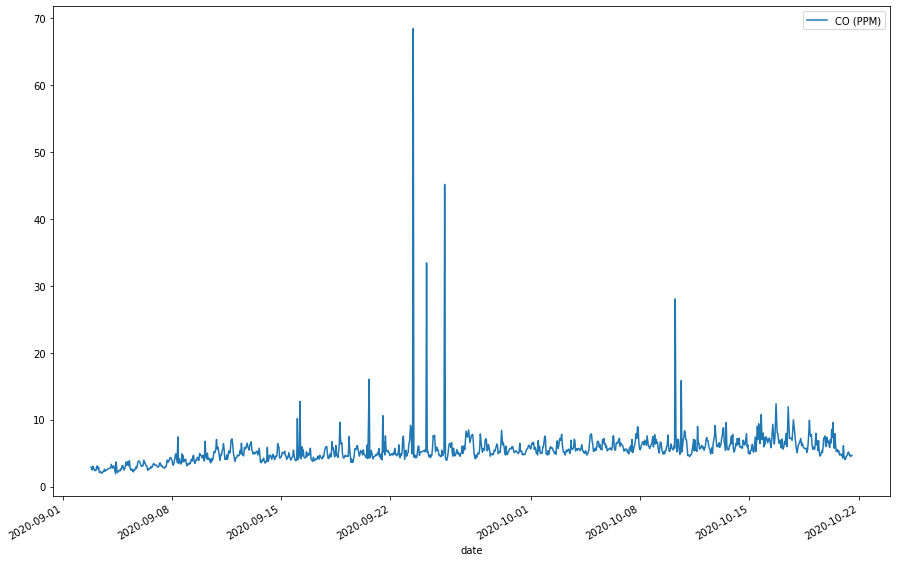

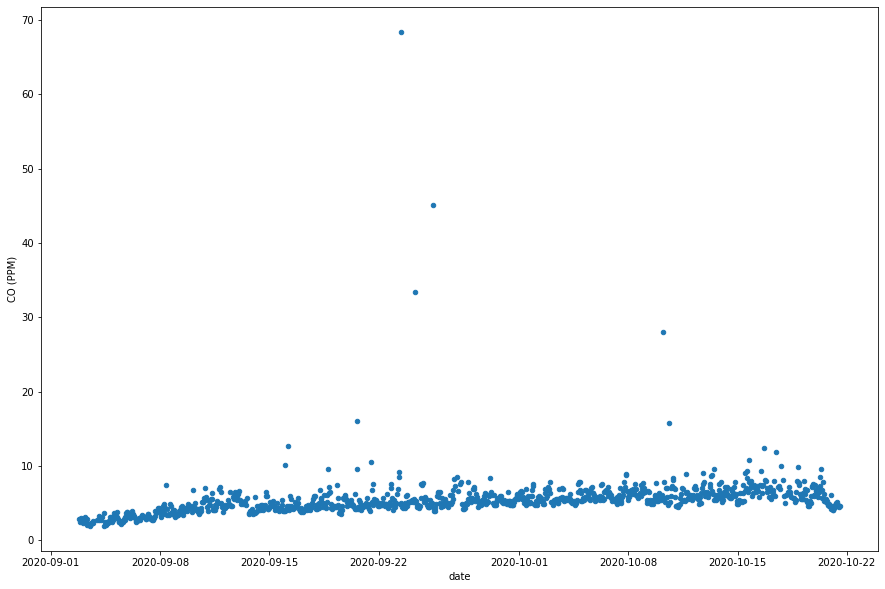

In [36]:
plottable_ds.plot(kind = 'line', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='CO (PPM)'>], dtype=object)

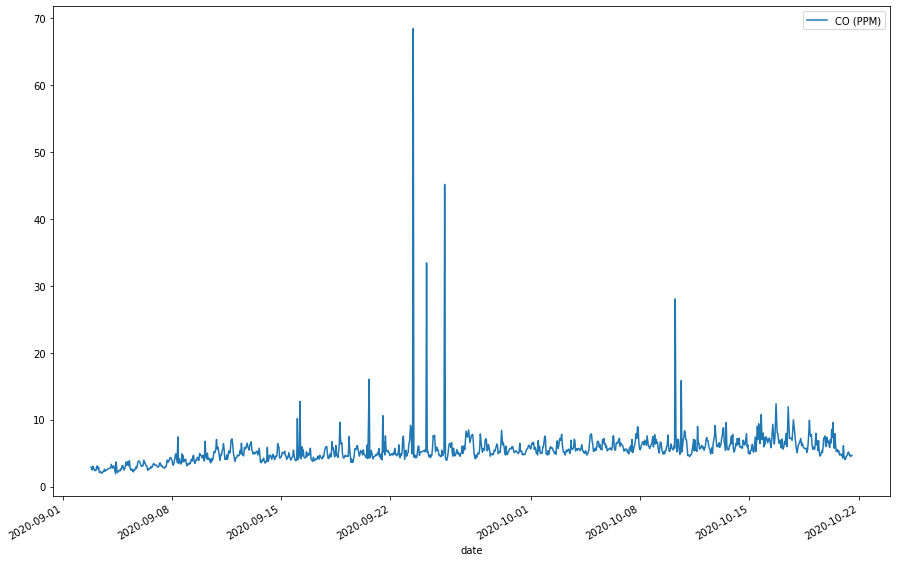

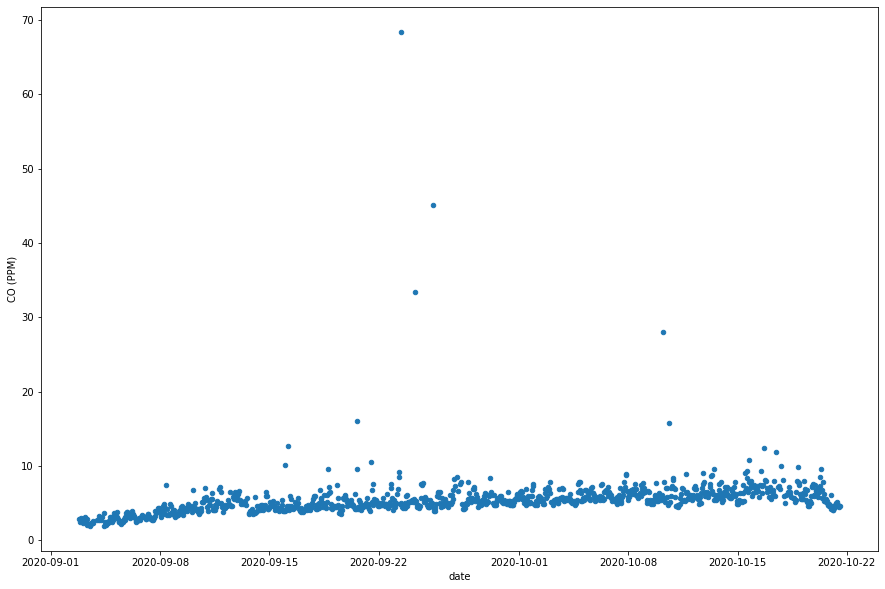

In [37]:
plottable_ds.plot(kind = 'line', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='NO2 (PPM)'>], dtype=object)

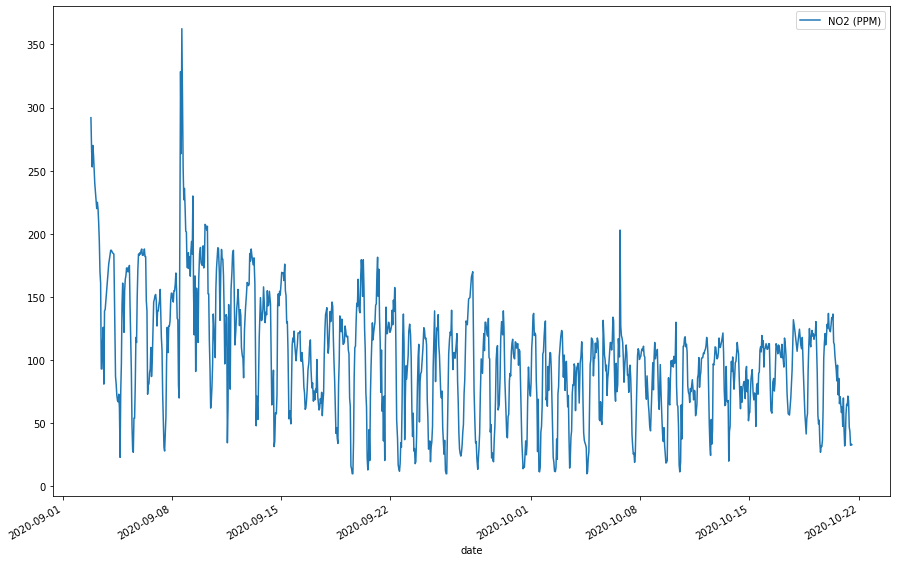

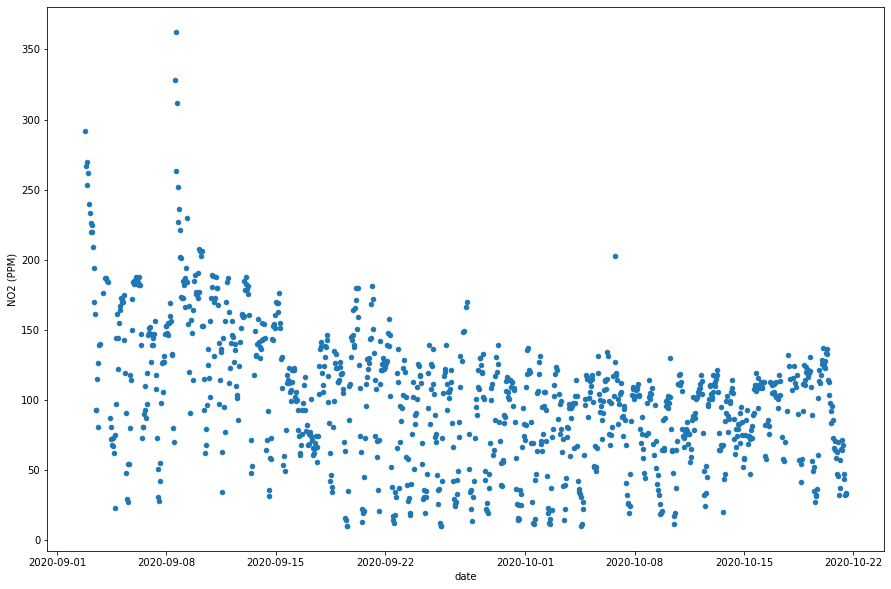

In [38]:
plottable_ds.plot(kind = 'line', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='O3 (PPB)'>], dtype=object)

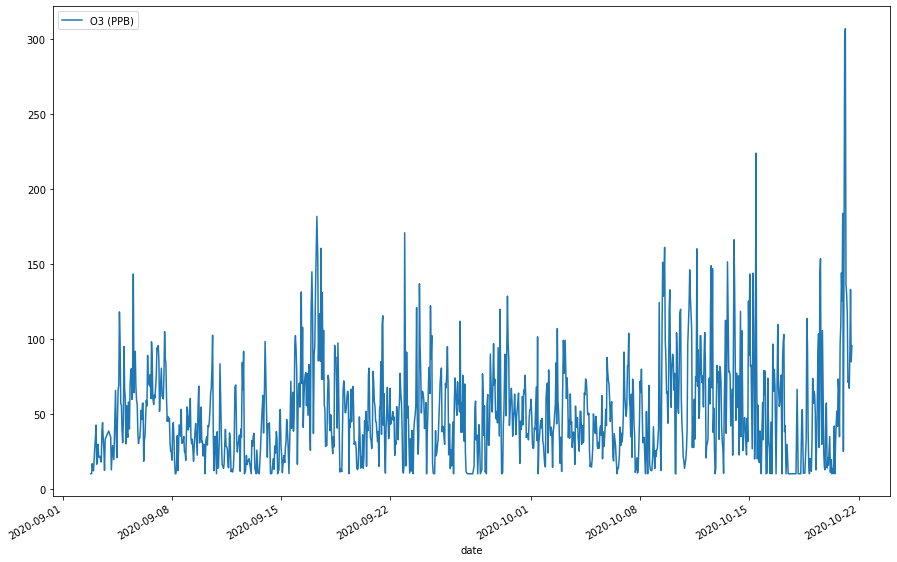

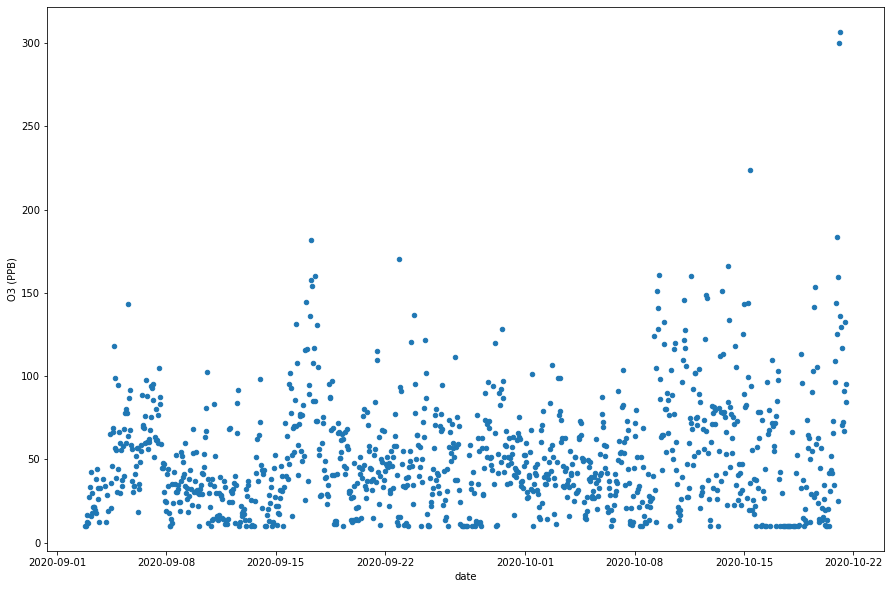

In [39]:
plottable_ds.plot(kind = 'line', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))

# Remove earlier section of data due to high variance at that point in time
preserve only data after 2020-09-15

In [28]:
from datetime import datetime

In [29]:
dataset = dataset[ dataset.index > datetime(2020, 9, 15) ]

# Replotting the figures

In [30]:
plottable_ds = dataset.reset_index()

array([<AxesSubplot:xlabel='date', ylabel='CO (PPM)'>], dtype=object)

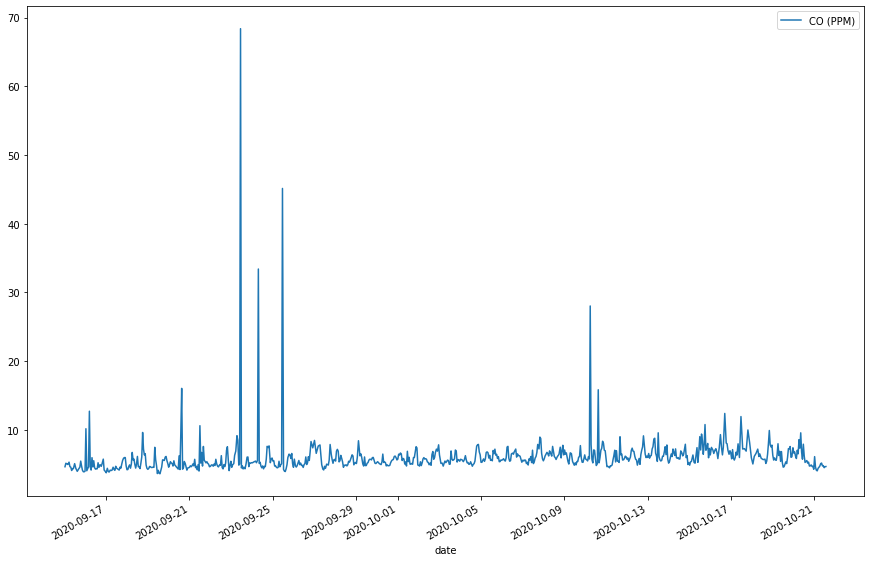

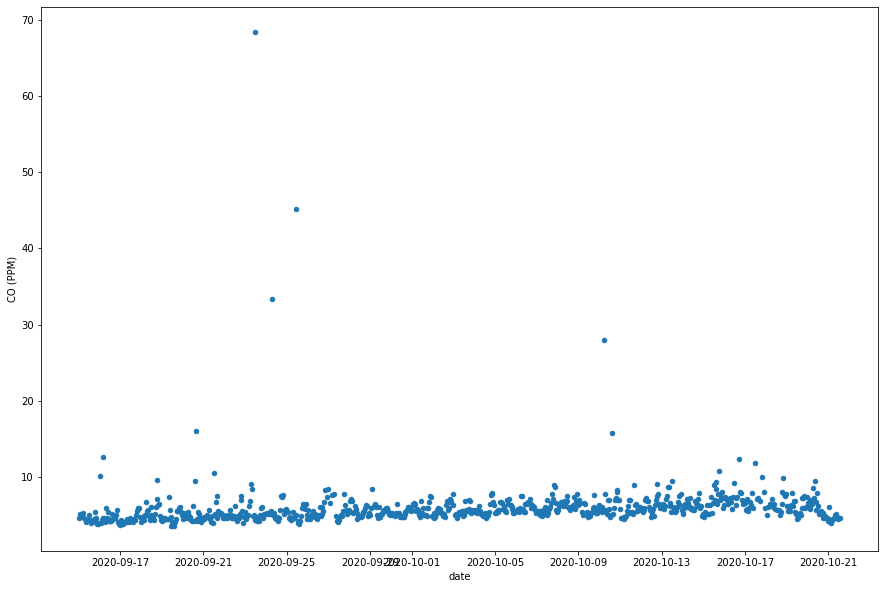

In [31]:
plottable_ds.plot(kind = 'line', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='CO (PPM)'>], dtype=object)

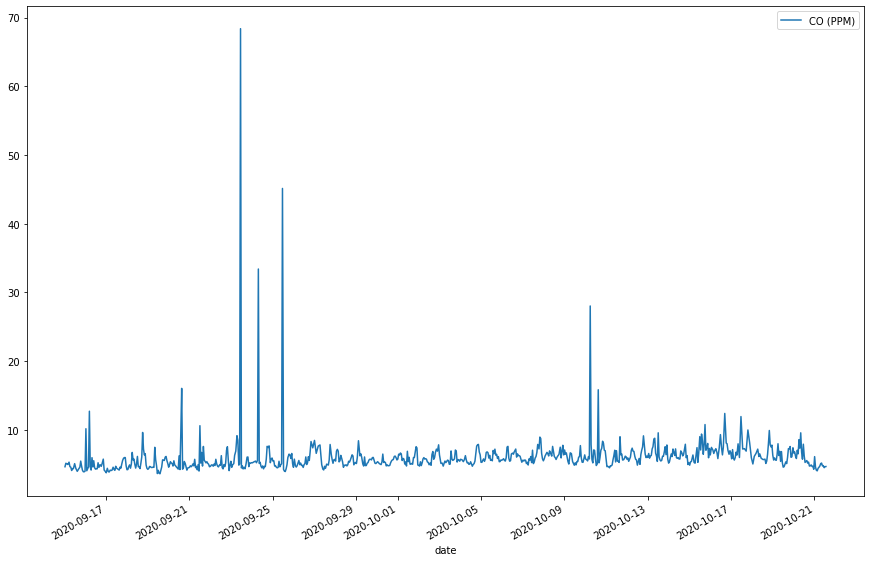

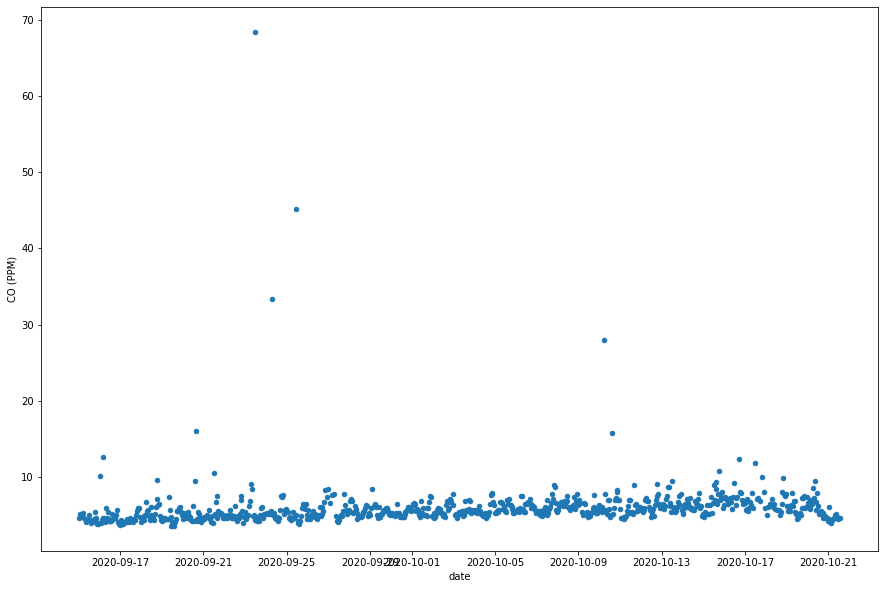

In [32]:
plottable_ds.plot(kind = 'line', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='NO2 (PPM)'>], dtype=object)

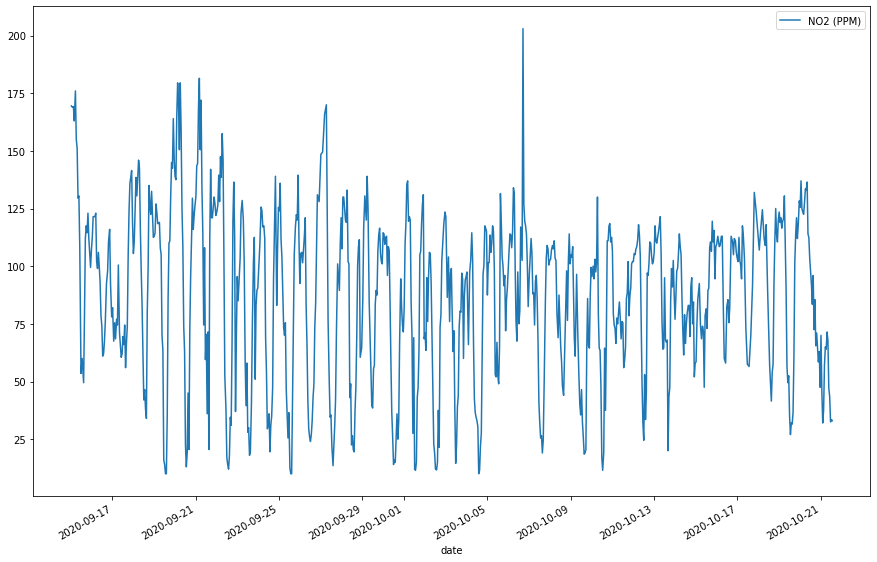

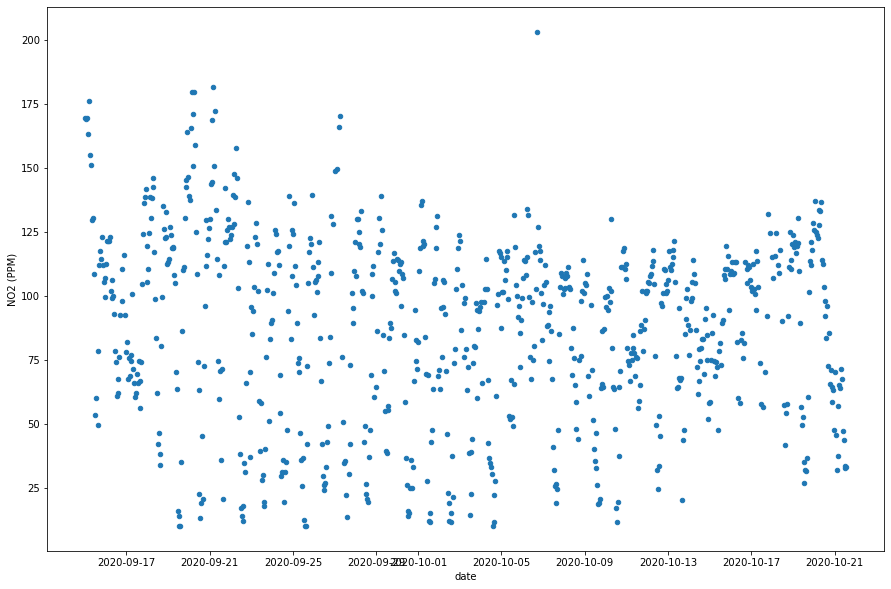

In [45]:
plottable_ds.plot(kind = 'line', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='O3 (PPB)'>], dtype=object)

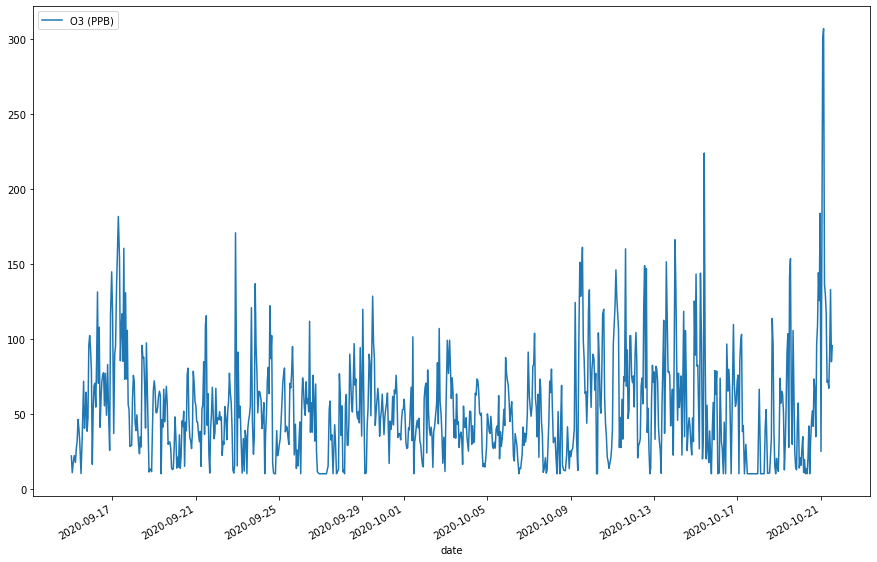

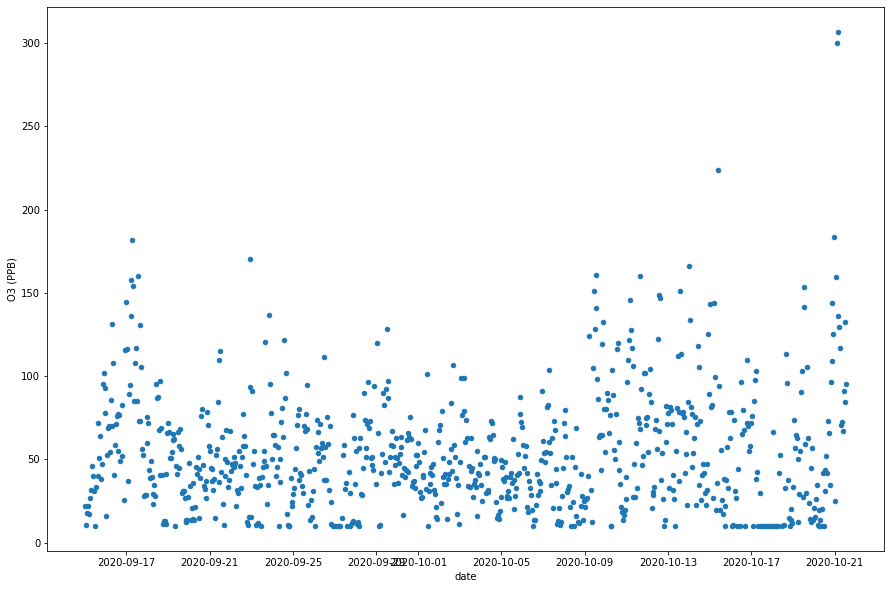

In [46]:
plottable_ds.plot(kind = 'line', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))

## Identifying Outliers with Skewness
[Reference](https://www.pluralsight.com/guides/cleaning-up-data-from-outliers)

In [47]:
print(dataset['PM25 (ug/m3)'].skew())
dataset['PM25 (ug/m3)'].describe()

15.24767863141923


count      825.000000
mean       172.488586
std       2272.221359
min          0.000000
25%          9.500000
50%         15.500000
75%         25.000000
max      36280.000000
Name: PM25 (ug/m3), dtype: float64

In [48]:
print(dataset['CO (PPM)'].skew())
dataset['CO (PPM)'].describe()

13.343248288915778


count    825.000000
mean       5.987181
std        3.133821
min        3.612000
25%        4.927500
50%        5.588500
75%        6.411500
max       68.387000
Name: CO (PPM), dtype: float64

In [42]:
print(dataset['NO2 (PPM)'].skew())
dataset['NO2 (PPM)'].describe()

-0.20758735718709137


count    825.000000
mean      87.059596
std       36.284822
min       10.000000
25%       63.500000
50%       94.000000
75%      113.000000
max      203.000000
Name: NO2 (PPM), dtype: float64

In [43]:
print(dataset['O3 (PPB)'].skew())
dataset['O3 (PPB)'].describe()

1.7022538003201473


count    825.000000
mean      54.246617
std       36.008351
min       10.000000
25%       29.617000
50%       47.223000
75%       71.685000
max      306.724000
Name: O3 (PPB), dtype: float64

# We need to remove those outliers!
## Best way to do this is by interpolating the outlier data since dropping the entire row will affect the other features

We consider two ways to do this:
1. [Use the quantile values to remove the outliers and then interpolate](#quantile_interpolation)
2. [Use the z-score to determine values which need to be interpolated and then interpolate](#zscore_interpolation)

## Use the quantile values to remove the outliers and then interpolate <a id='quantile_interpolation'>[1]</a>
We use the median value to interpolate the outliers

In [33]:
pm25_max_threshold, pm25_min_threshold = dataset['PM25 (ug/m3)'].quantile([0.99, 0.01])
print('pm25 max threshold: ' + str(pm25_max_threshold))
print('pm25 min threshold: ' + str(pm25_min_threshold))

co_max_threshold, co_min_threshold = dataset['CO (PPM)'].quantile([0.99, 0.01])
print('co max threshold: ' + str(co_max_threshold))
print('co min threshold: ' + str(co_min_threshold))

no2_max_threshold, no2_min_threshold = dataset['NO2 (PPM)'].quantile([0.99, 0.01])
print('no2 max threshold: ' + str(no2_max_threshold))
print('no2 min threshold: ' + str(no2_min_threshold))

o3_max_threshold, o3_min_threshold = dataset['O3 (PPB)'].quantile([0.99, 0.01])
print('o3 max threshold: ' + str(o3_max_threshold))
print('o3 min threshold: ' + str(o3_min_threshold))

pm25 max threshold: 70.75999999999999
pm25 min threshold: 1.3733333333333333
co max threshold: 11.65725999999999
co min threshold: 3.9386
no2 max threshold: 169.43999999999997
no2 min threshold: 11.74666666666667
o3 max threshold: 160.21483999999998
o3 min threshold: 10.0


In [34]:
# identify how many we need to interpolate

ol_count = dataset[ (dataset['PM25 (ug/m3)'] < pm25_min_threshold) | (dataset['PM25 (ug/m3)'] > pm25_max_threshold) ].shape[0]
print('pm25 outliers: {}'.format(ol_count))
ol_count = dataset[ (dataset['CO (PPM)'] < co_min_threshold) | (dataset['CO (PPM)'] > co_max_threshold) ].shape[0]
print('co outliers: {}'.format(ol_count))
ol_count = dataset[ (dataset['NO2 (PPM)'] < no2_min_threshold) | (dataset['NO2 (PPM)'] > no2_max_threshold) ].shape[0]
print('no2 outliers: {}'.format(ol_count))
ol_count = dataset[ (dataset['O3 (PPB)'] < o3_min_threshold) | (dataset['O3 (PPB)'] > o3_max_threshold) ].shape[0]
print('o3 outliers: {}'.format(ol_count))

pm25 outliers: 18
co outliers: 18
no2 outliers: 18
o3 outliers: 9


In [35]:
# get the median value for the dataset
pm25_median = dataset['PM25 (ug/m3)'].quantile(0.5)
co_median = dataset['CO (PPM)'].quantile(0.5)
no2_median = dataset['NO2 (PPM)'].quantile(0.5)
o3_median = dataset['O3 (PPB)'].quantile(0.5)

In [36]:
dataset['PM25 (ug/m3)'] = dataset['PM25 (ug/m3)'].apply(lambda x: x if x <= pm25_max_threshold and x >= pm25_min_threshold
                                  else pm25_median)
dataset['CO (PPM)'] = dataset['CO (PPM)'].apply(lambda x: x if x <= co_max_threshold and x >= co_min_threshold
                                  else co_median)
dataset['NO2 (PPM)'] = dataset['NO2 (PPM)'].apply(lambda x: x if x <= no2_max_threshold and x >= no2_min_threshold
                                  else no2_median)
dataset['O3 (PPB)'] = dataset['O3 (PPB)'].apply(lambda x: x if x <= o3_max_threshold and x >= o3_min_threshold
                                  else o3_median)

## We use the zscore to determine values which need to be interpolated <a id='zscore_interpolation'>[2] </a>
[Stackoverflow solution for this scenario](https://stackoverflow.com/questions/59678724/replace-given-columns-outliers-with-mean-of-before-and-after-rows-values-in-pa)

In [48]:
from scipy import stats

In [49]:
mask = (np.abs(stats.zscore(dataset['PM25 (ug/m3)'])) > 1.65)
dataset['PM25 (ug/m3)'] = dataset['PM25 (ug/m3)'].mask(mask).interpolate()

In [50]:
mask = (np.abs(stats.zscore(dataset['CO (PPM)'])) > 1.65)
dataset['CO (PPM)'] = dataset['CO (PPM)'].mask(mask).interpolate()

In [51]:
mask = (np.abs(stats.zscore(dataset['NO2 (PPM)'])) > 1.65)
dataset['NO2 (PPM)'] = dataset['NO2 (PPM)'].mask(mask).interpolate()

In [52]:
mask = (np.abs(stats.zscore(dataset['O3 (PPB)'])) > 1.65)
dataset['O3 (PPB)'] = dataset['O3 (PPB)'].mask(mask).interpolate()

In [53]:
# check for nulls
dataset.isnull().sum()

Temperature (°C)       0
Humidity (%RH)         0
PM25 (ug/m3)           0
CO (PPM)               0
NO2 (PPM)              0
O3 (PPB)               0
Wind Speed (m/s)       0
api_weather Code       0
Wind Direction Code    0
dtype: int64

In [54]:
# fill nulls with median value
dataset['NO2 (PPM)'] = dataset['NO2 (PPM)'].fillna(dataset['NO2 (PPM)'].quantile(0.5))

In [55]:
# check for nulls again
dataset.isnull().sum()

Temperature (°C)       0
Humidity (%RH)         0
PM25 (ug/m3)           0
CO (PPM)               0
NO2 (PPM)              0
O3 (PPB)               0
Wind Speed (m/s)       0
api_weather Code       0
Wind Direction Code    0
dtype: int64

## Again, Let's identify outliers with skewness
[Reference](https://www.pluralsight.com/guides/cleaning-up-data-from-outliers)

In [56]:
print(dataset['PM25 (ug/m3)'].skew())
dataset['PM25 (ug/m3)'].describe()

0.40436079589740004


count    825.000000
mean      16.417576
std        8.578026
min        1.500000
25%        9.500000
50%       15.500000
75%       22.000000
max       36.000000
Name: PM25 (ug/m3), dtype: float64

In [57]:
print(dataset['CO (PPM)'].skew())
dataset['CO (PPM)'].describe()

0.2854314886065083


count    825.000000
mean       5.639508
std        0.873843
min        3.950000
25%        4.943500
50%        5.588500
75%        6.260000
max        7.604000
Name: CO (PPM), dtype: float64

In [58]:
print(dataset['NO2 (PPM)'].skew())
dataset['NO2 (PPM)'].describe()

-0.2977368765891225


count    825.000000
mean      88.187778
std       29.206217
min       31.000000
25%       66.000000
50%       94.000000
75%      111.500000
max      142.500000
Name: NO2 (PPM), dtype: float64

In [59]:
print(dataset['O3 (PPB)'].skew())
dataset['O3 (PPB)'].describe()

0.24337757108154814


count    825.000000
mean      47.715838
std       24.118736
min       10.000000
25%       29.594000
50%       46.090000
75%       65.735000
max      104.828000
Name: O3 (PPB), dtype: float64

## Let's plot again

In [60]:
plottable_ds = dataset.reset_index()

array([<AxesSubplot:xlabel='date', ylabel='PM25 (ug/m3)'>], dtype=object)

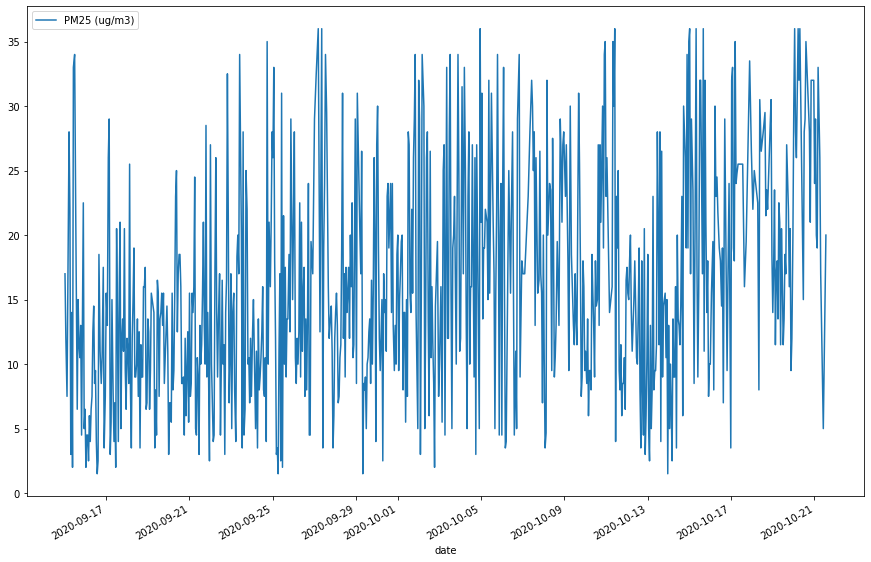

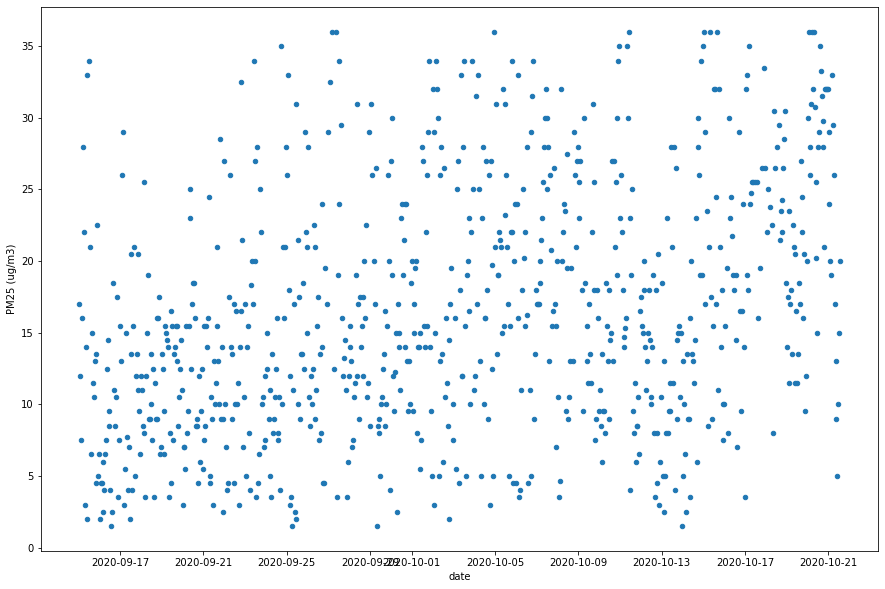

In [61]:
plottable_ds.plot(kind = 'line', x='date', y='PM25 (ug/m3)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='PM25 (ug/m3)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='CO (PPM)'>], dtype=object)

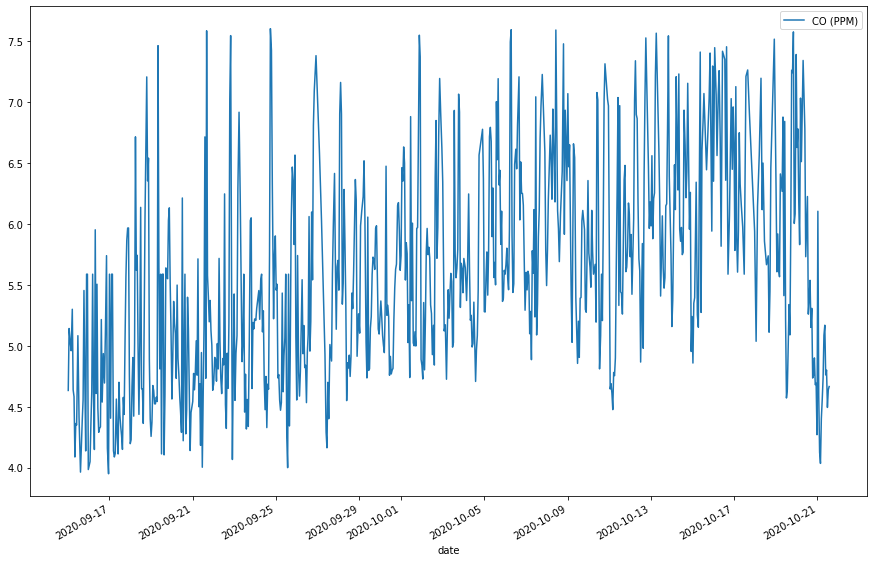

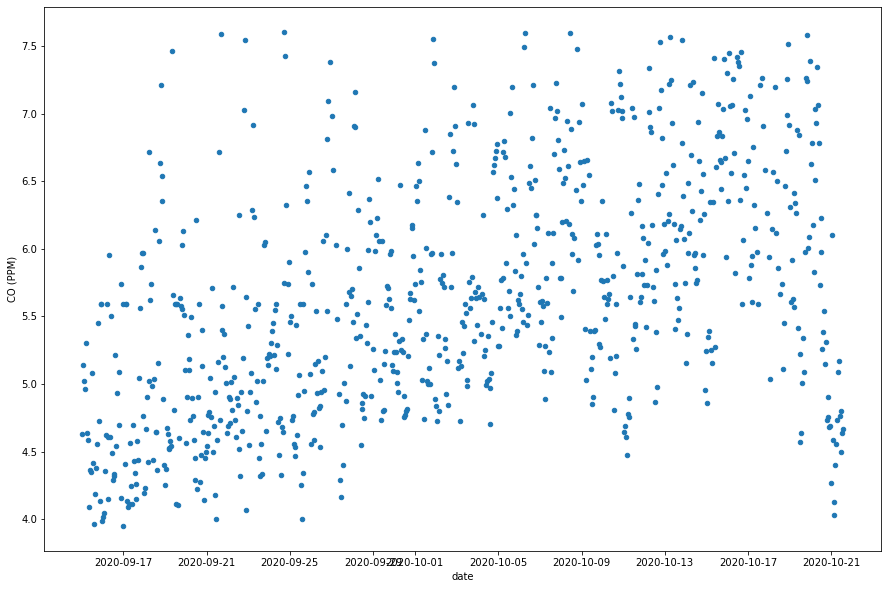

In [62]:
plottable_ds.plot(kind = 'line', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='NO2 (PPM)'>], dtype=object)

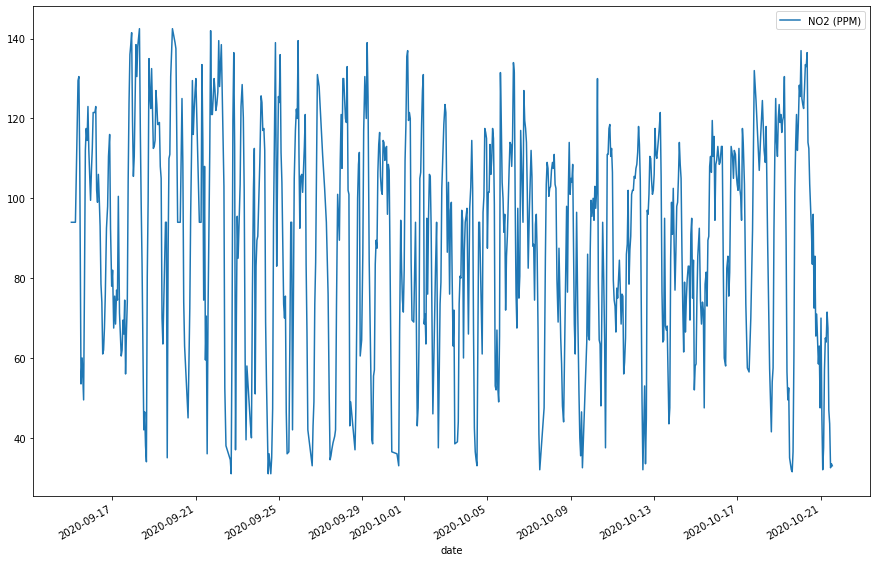

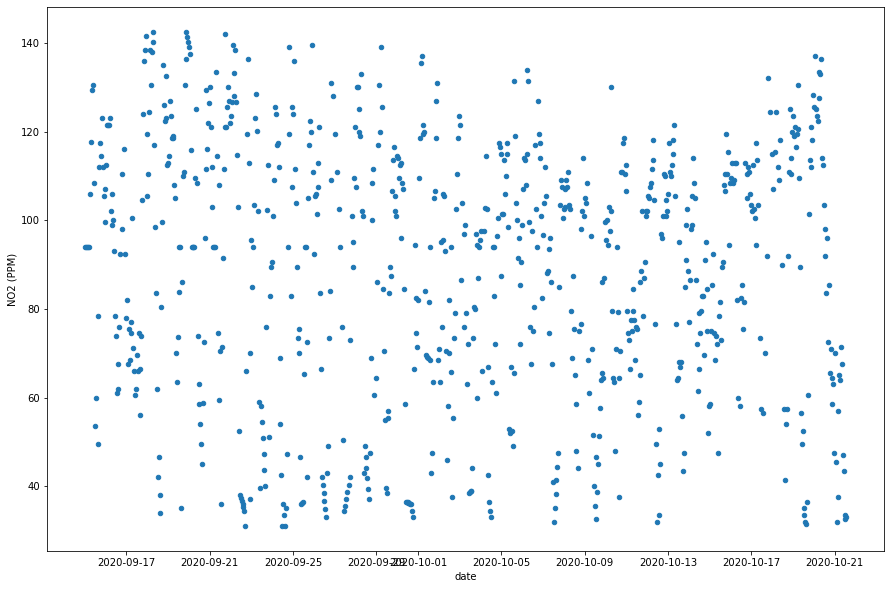

In [63]:
plottable_ds.plot(kind = 'line', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='O3 (PPB)'>], dtype=object)

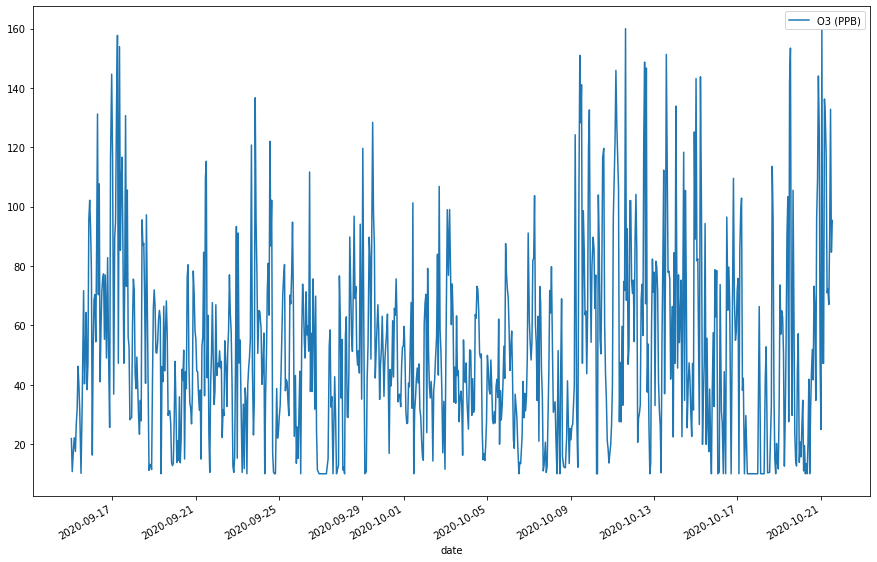

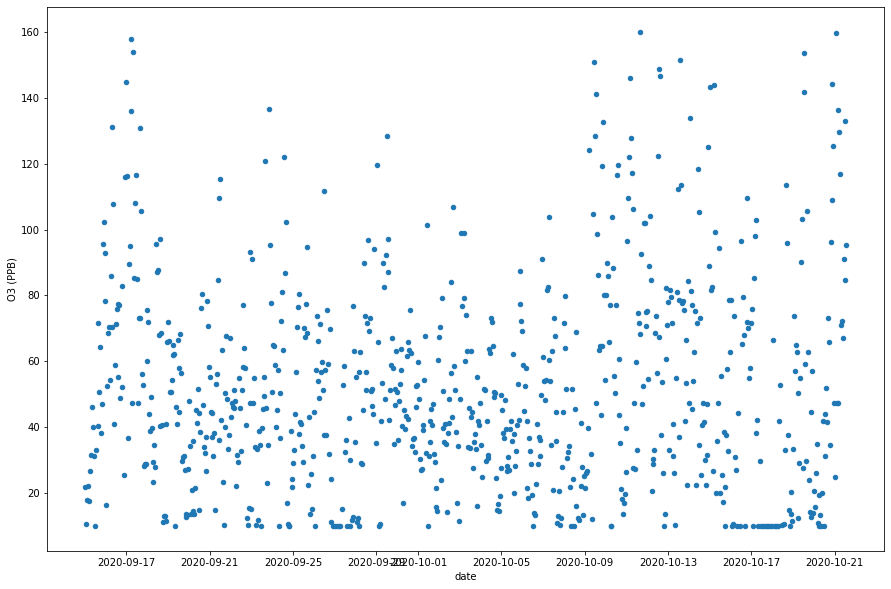

In [61]:
plottable_ds.plot(kind = 'line', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))

# Do statistical tests and do transformations if necessary
[Reference](https://machinelearningmastery.com/time-series-data-stationary-python/)

<AxesSubplot:>

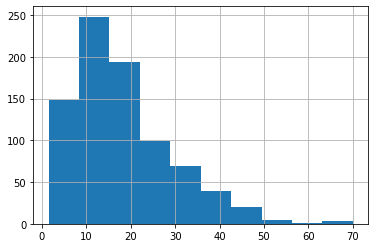

In [62]:
dataset['PM25 (ug/m3)'].hist()

<AxesSubplot:>

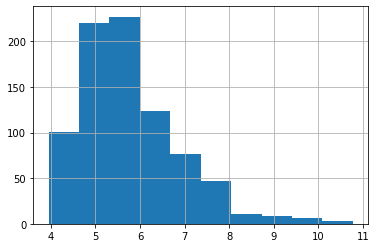

In [63]:
dataset['CO (PPM)'].hist()

<AxesSubplot:>

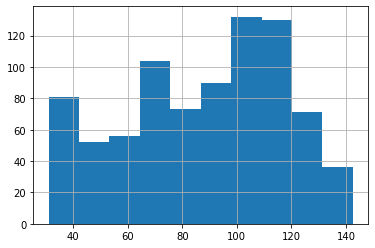

In [66]:
dataset['NO2 (PPM)'].hist()

<AxesSubplot:>

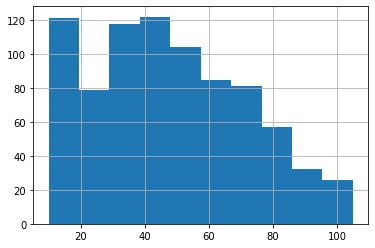

In [67]:
dataset['O3 (PPB)'].hist()

## Box plot

<AxesSubplot:>

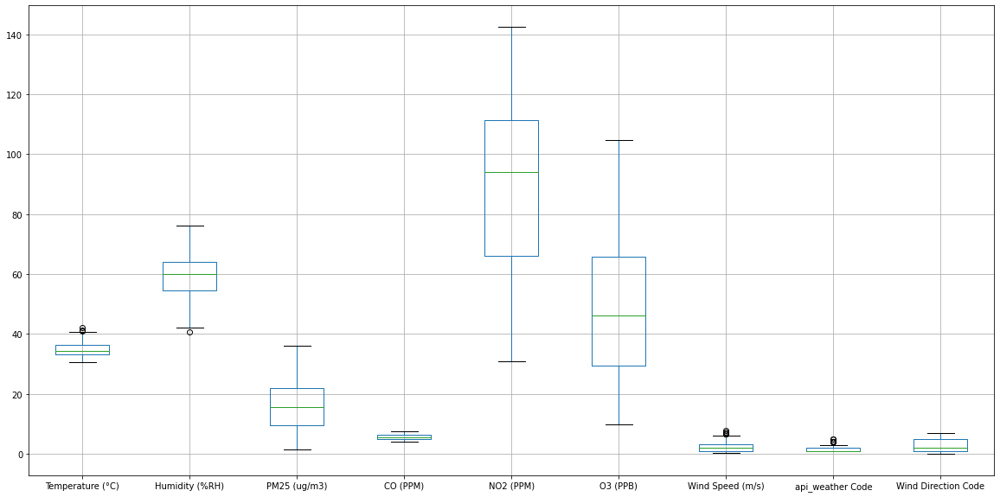

In [68]:
dataset.boxplot(figsize = (20,10))

## Augmented Dickey-Fuller test (test for stationarity)
[reference article for this code](https://www.analyticsvidhya.com/blog/2018/09/non-stationary-time-series-python/)

**Null Hypothesis**: The series has a unit root (value of a =1)

**Alternate Hypothesis**: The series has no unit root. (series is stationary)

In [61]:
from statsmodels.tsa.stattools import adfuller

In [62]:
#define function for ADF test
def adf_test(timeseries):
    #Perform Dickey-Fuller test:
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value
    return dfoutput

col_names = [name for name in dataset.columns]
for col_name in col_names:
    print('Testing column: ' + col_name)
    print ('Results of Dickey-Fuller Test:')
    print(adf_test(dataset[col_name]))
    print('================================')

Testing column: Temperature (°C)
Results of Dickey-Fuller Test:
Test Statistic                  -5.161193
p-value                          0.000011
#Lags Used                       0.000000
Number of Observations Used    824.000000
Critical Value (1%)             -3.438311
Critical Value (5%)             -2.865054
Critical Value (10%)            -2.568641
dtype: float64
Testing column: Humidity (%RH)
Results of Dickey-Fuller Test:
Test Statistic                  -2.999036
p-value                          0.034985
#Lags Used                      19.000000
Number of Observations Used    805.000000
Critical Value (1%)             -3.438499
Critical Value (5%)             -2.865137
Critical Value (10%)            -2.568685
dtype: float64
Testing column: PM25 (ug/m3)
Results of Dickey-Fuller Test:
Test Statistic                  -5.537127
p-value                          0.000002
#Lags Used                       6.000000
Number of Observations Used    818.000000
Critical Value (1%)         

E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\numpy\linalg\linalg.py:1872: RuntimeWarning: invalid value encountered in greater
  return count_nonzero(S > tol, axis=-1)


Test Statistic                  -3.960459
p-value                          0.001632
#Lags Used                      21.000000
Number of Observations Used    803.000000
Critical Value (1%)             -3.438520
Critical Value (5%)             -2.865146
Critical Value (10%)            -2.568690
dtype: float64
Testing column: api_weather Code
Results of Dickey-Fuller Test:
Test Statistic                -1.122619e+01
p-value                        1.957968e-20
#Lags Used                     2.000000e+00
Number of Observations Used    8.220000e+02
Critical Value (1%)           -3.438330e+00
Critical Value (5%)           -2.865063e+00
Critical Value (10%)          -2.568646e+00
dtype: float64
Testing column: Wind Direction Code
Results of Dickey-Fuller Test:
Test Statistic                -1.115855e+01
p-value                        2.825481e-20
#Lags Used                     2.000000e+00
Number of Observations Used    8.220000e+02
Critical Value (1%)           -3.438330e+00
Critical Value (5

## KPSS (Kwiatkowski-Phillips-Schmidt-Shin) Test
[same article as above](https://www.analyticsvidhya.com/blog/2018/09/non-stationary-time-series-python/)

**Null Hypothesis**: The process is trend stationary.

**Alternate Hypothesis**: The series has a unit root (series is not stationary).

In [68]:
from statsmodels.tsa.stattools import kpss

In [69]:
#define KPSS
def kpss_test(timeseries):
    kpsstest = kpss(timeseries, regression='c', nlags="auto")
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    return kpss_output
    
col_names = [name for name in dataset.columns]
for col_name in col_names:
    print ('Results of KPSS Test:')
    print('Testing column: ' + col_name)
    print(kpss_test(dataset[col_name]))
    print('================================')

Results of KPSS Test:
Testing column: Temperature (°C)
Test Statistic            1.416957
p-value                   0.010000
Lags Used                16.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64
Results of KPSS Test:
Testing column: Humidity (%RH)
Test Statistic            1.188798
p-value                   0.010000
Lags Used                16.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64
Results of KPSS Test:
Testing column: PM25 (ug/m3)
Test Statistic            2.188936
p-value                   0.010000
Lags Used                15.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64
Results of KPSS Test:
Testing column: CO (PPM)
Test Statistic

E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Me

Now let's combine the two test in a function to find out which is which (refer to the article for the assumptions below)

In [70]:
def determine_stationary(time_series):
    adf_test_res = adf_test(time_series)
    kpss_test_res = kpss_test(time_series)
    adf_is_stationary = adf_test_res[1] < 0.05
    kpss_is_stationary = kpss_test_res[1] >= 0.05
    
    if adf_is_stationary and kpss_is_stationary:
        print(time_series.name + ' is stationary!')
    elif not adf_is_stationary and not kpss_is_stationary:
        print(time_series.name + ' is NOT stationary!')
    elif not adf_is_stationary and kpss_is_stationary:
        print(time_series.name + ' is trend stationary!')
    elif adf_is_stationary and not kpss_is_stationary:
        print(time_series.name + ' is difference stationary!')

In [71]:
col_names = [name for name in dataset.columns]
for col_name in col_names:
    determine_stationary(dataset[col_name])
    print('================================')

E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Me

Temperature (°C) is NOT stationary!
Humidity (%RH) is difference stationary!
PM25 (ug/m3) is difference stationary!
CO (PPM) is NOT stationary!
NO2 (PPM) is stationary!
O3 (PPB) is stationary!
Wind Speed (m/s) is stationary!
api_weather Code is difference stationary!
Wind Direction Code is stationary!


E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1876: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(warn_msg.format(direction="greater"), InterpolationWarning)


# It is important to apply the transformations later in the preprocessing step before the machine learning procedure!

In [215]:
stationarized_ds = dataset.copy()
stationarized_ds['PM25 (ug/m3) diff'] = dataset['PM25 (ug/m3)'] - dataset['PM25 (ug/m3)'].shift(1)
stationarized_ds['CO (PPM) log'] = np.log(stationarized_ds['CO (PPM)'])
stationarized_ds.dropna(inplace=True)

## Determine stationarity again

In [216]:
col_names = [name for name in stationarized_ds.columns]
for col_name in col_names:
    determine_stationary(stationarized_ds[col_name])
    print('================================')

E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Me

Temperature (°C) is NOT stationary!
Humidity (%RH) is difference stationary!
PM25 (ug/m3) is difference stationary!
CO (PPM) is NOT stationary!
NO2 (PPM) is stationary!
O3 (PPB) is stationary!
Wind Speed (m/s) is stationary!
api_weather Code is difference stationary!
Wind Direction Code is stationary!
PM25 (ug/m3) diff is stationary!
CO (PPM) log is NOT stationary!


E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1876: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(warn_msg.format(direction="greater"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1876: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(warn_msg.format(direction="greater"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)


Nothing can be done with the CO (PPM) unfortunately

# Apply a feature engineering technique

## Reformat the time series data to a supervised machine learning problem
That is, make the inputs (MFs and APCs) be related to its past inputs (features) in predicting its future outputs (label)

![Feature engineering of the data](figs/ml_test/feature_engineering.png)

In [37]:
from pandas import DataFrame
from pandas import concat

### Lagging series function helpers

In [38]:
def transform_series_to_lag_dataframe(series, window_size=1, exclude_original=False):
    df_out = DataFrame()
    
    if window_size < 1:
        window_size = 1
    # concatenate the lagging series to the dataframe, 
    #   start from highest index to preserve order of the lagging series (current series should be at last column)
    for count in range(window_size, 0, -1):
        df_out[series.name + '(t-{})'.format(count)] = series.shift(count)
    # concatenate the original series, if desired
    if not exclude_original:
        df_out[series.name] = series
    return df_out

def transform_dataframe_to_lag_dataframe(dataframe, include_columns=None, window_size=1, drop_nan=True):
    df_out = DataFrame()
    if window_size < 1:
        window_size = 1
    if include_columns is None:
        return dataframe
    # concatenate each lagging dataframe to the new dataframe
    for column in dataframe.columns:
        if column in include_columns:
            lag_df = transform_series_to_lag_dataframe(dataframe[column], window_size, exclude_original=False)
        else:
            lag_df = dataframe[column]
        df_out = concat([df_out,lag_df], axis=1)
    if drop_nan:
        df_out.dropna(inplace=True)
    return df_out

In [39]:
sv_window_size = 12
sv_data =  transform_dataframe_to_lag_dataframe(dataset, 
                                                include_columns=['Temperature (°C)', 'Humidity (%RH)', 'PM25 (ug/m3)',
                                                                 'CO (PPM)', 'NO2 (PPM)', 'O3 (PPB)',
                                                                 'Wind Speed (m/s)', 'Wind Direction Code', 'api_weather Code'
                                                                ], window_size=sv_window_size, drop_nan=True)

### Leading series function helpers

In [40]:
def transform_series_to_lead_dataframe(series, forecast_size=1, exclude_original=False):
    df_out = DataFrame()
    
    if forecast_size < 1:
        forecast_size = 1
    # concatenate the original series, if desired
    if not exclude_original:
        df_out[series.name] = series
    # concatenate the leading series to the dataframe, 
    #   start from lowest index to preserve order of the leading series (current series should be at first column)
    for count in range(1, forecast_size + 1, 1):
        df_out[series.name + '(t+{})'.format(count)] = series.shift(-count)
    return df_out

def transform_dataframe_to_lead_dataframe(dataframe, include_columns=None, forecast_size=1, drop_nan=True):
    df_out = DataFrame()
    if forecast_size < 1:
        forecast_size = 1
    if include_columns is None:
        return dataframe
    # concatenate each leading dataframe to the new dataframe
    for column in dataframe.columns:
        if column in include_columns:
            lag_df = transform_series_to_lead_dataframe(dataframe[column], forecast_size, exclude_original=False)
        else:
            lag_df = dataframe[column]
        df_out = concat([df_out,lag_df], axis=1)
    if drop_nan:
        df_out.dropna(inplace=True)
    return df_out

In [41]:
sv_forecast_size = 12
sv_data =  transform_dataframe_to_lead_dataframe(sv_data, 
                                                include_columns=['Temperature (°C)', 'Humidity (%RH)', 'PM25 (ug/m3)',
                                                                 'CO (PPM)', 'NO2 (PPM)', 'O3 (PPB)',
                                                                 'Wind Speed (m/s)', 'Wind Direction Code', 'api_weather Code'
                                                                ], forecast_size=sv_forecast_size, drop_nan=True)

In [42]:
for col in sv_data.columns:
    print(col)

Temperature (°C)(t-12)
Temperature (°C)(t-11)
Temperature (°C)(t-10)
Temperature (°C)(t-9)
Temperature (°C)(t-8)
Temperature (°C)(t-7)
Temperature (°C)(t-6)
Temperature (°C)(t-5)
Temperature (°C)(t-4)
Temperature (°C)(t-3)
Temperature (°C)(t-2)
Temperature (°C)(t-1)
Temperature (°C)
Temperature (°C)(t+1)
Temperature (°C)(t+2)
Temperature (°C)(t+3)
Temperature (°C)(t+4)
Temperature (°C)(t+5)
Temperature (°C)(t+6)
Temperature (°C)(t+7)
Temperature (°C)(t+8)
Temperature (°C)(t+9)
Temperature (°C)(t+10)
Temperature (°C)(t+11)
Temperature (°C)(t+12)
Humidity (%RH)(t-12)
Humidity (%RH)(t-11)
Humidity (%RH)(t-10)
Humidity (%RH)(t-9)
Humidity (%RH)(t-8)
Humidity (%RH)(t-7)
Humidity (%RH)(t-6)
Humidity (%RH)(t-5)
Humidity (%RH)(t-4)
Humidity (%RH)(t-3)
Humidity (%RH)(t-2)
Humidity (%RH)(t-1)
Humidity (%RH)
Humidity (%RH)(t+1)
Humidity (%RH)(t+2)
Humidity (%RH)(t+3)
Humidity (%RH)(t+4)
Humidity (%RH)(t+5)
Humidity (%RH)(t+6)
Humidity (%RH)(t+7)
Humidity (%RH)(t+8)
Humidity (%RH)(t+9)
Humidity (%

# Machine Learning begins...
Unfortunately, most models only support one output with multiple inputs, but we have four. So we have to make this model four times.

- y, target value/predictor
- x, dependent values

## let's get the metrics here: root mean squared error  and plcc (correlation coefficient)

In [43]:
from sklearn.metrics import mean_squared_error
from scipy.stats import pearsonr

In [44]:
# for saving the model to a file
import joblib

## Split into test, train sets

In [45]:
# get the column indexes for each MF and APC for each tick
col_names = [val for val in dataset.columns.values if val != 'date']
dataset_at_time_idxs  = {}
cat_dataset_at_time_idxs, num_dataset_at_time_idxs = {}, {}
# lagging
for time in range(1, sv_window_size + 1, 1):
    dataset_at_time_idxs['t-{}'.format(time)] = [
        sv_data.columns.get_loc('{}(t-{})'.format(col_name, time)) for col_name in col_names]

# leading
for time in range(1, sv_forecast_size + 1, 1):
    dataset_at_time_idxs['t+{}'.format(time)] = [
        sv_data.columns.get_loc('{}(t+{})'.format(col_name, time)) for col_name in col_names]
    
# numerical only (labels, leading)
for time in range(1, sv_forecast_size + 1, 1):
    num_dataset_at_time_idxs['t+{}'.format(time)] = [
        sv_data.columns.get_loc('{}(t+{})'.format(col_name, time)) for col_name in col_names if 'Code' not in col_name]
    
# categorical only (labels, leading)
for time in range(1, sv_forecast_size + 1, 1):
    cat_dataset_at_time_idxs['t+{}'.format(time)] = [
        sv_data.columns.get_loc('{}(t+{})'.format(col_name, time)) for col_name in col_names if 'Code' in col_name]
    
# formulate the dataset for each tick
dataset_at_time = {}
for time_step, dataset_idxs in dataset_at_time_idxs.items():
    dataset_at_time[time_step] = sv_data.iloc[:, dataset_idxs]

# formulate the dataset for the numerical labels
num_dataset_at_time = {}
# formulate the dataset for the categorical labels
for time_step, dataset_idxs in num_dataset_at_time_idxs.items():
    num_dataset_at_time[time_step] = sv_data.iloc[:, dataset_idxs]
    
cat_dataset_at_time = {}
# formulate the dataset for the categorical labels
for time_step, dataset_idxs in cat_dataset_at_time_idxs.items():
    cat_dataset_at_time[time_step] = sv_data.iloc[:, dataset_idxs].astype('int32')

In [46]:
dataset_at_time_idxs

{'t-1': [11, 36, 61, 86, 111, 136, 161, 186, 211],
 't-2': [10, 35, 60, 85, 110, 135, 160, 185, 210],
 't-3': [9, 34, 59, 84, 109, 134, 159, 184, 209],
 't-4': [8, 33, 58, 83, 108, 133, 158, 183, 208],
 't-5': [7, 32, 57, 82, 107, 132, 157, 182, 207],
 't-6': [6, 31, 56, 81, 106, 131, 156, 181, 206],
 't-7': [5, 30, 55, 80, 105, 130, 155, 180, 205],
 't-8': [4, 29, 54, 79, 104, 129, 154, 179, 204],
 't-9': [3, 28, 53, 78, 103, 128, 153, 178, 203],
 't-10': [2, 27, 52, 77, 102, 127, 152, 177, 202],
 't-11': [1, 26, 51, 76, 101, 126, 151, 176, 201],
 't-12': [0, 25, 50, 75, 100, 125, 150, 175, 200],
 't+1': [13, 38, 63, 88, 113, 138, 163, 188, 213],
 't+2': [14, 39, 64, 89, 114, 139, 164, 189, 214],
 't+3': [15, 40, 65, 90, 115, 140, 165, 190, 215],
 't+4': [16, 41, 66, 91, 116, 141, 166, 191, 216],
 't+5': [17, 42, 67, 92, 117, 142, 167, 192, 217],
 't+6': [18, 43, 68, 93, 118, 143, 168, 193, 218],
 't+7': [19, 44, 69, 94, 119, 144, 169, 194, 219],
 't+8': [20, 45, 70, 95, 120, 145, 170

In [47]:
cat_dataset_at_time_idxs

{'t+1': [188, 213],
 't+2': [189, 214],
 't+3': [190, 215],
 't+4': [191, 216],
 't+5': [192, 217],
 't+6': [193, 218],
 't+7': [194, 219],
 't+8': [195, 220],
 't+9': [196, 221],
 't+10': [197, 222],
 't+11': [198, 223],
 't+12': [199, 224]}

In [48]:
num_dataset_at_time_idxs

{'t+1': [13, 38, 63, 88, 113, 138, 163],
 't+2': [14, 39, 64, 89, 114, 139, 164],
 't+3': [15, 40, 65, 90, 115, 140, 165],
 't+4': [16, 41, 66, 91, 116, 141, 166],
 't+5': [17, 42, 67, 92, 117, 142, 167],
 't+6': [18, 43, 68, 93, 118, 143, 168],
 't+7': [19, 44, 69, 94, 119, 144, 169],
 't+8': [20, 45, 70, 95, 120, 145, 170],
 't+9': [21, 46, 71, 96, 121, 146, 171],
 't+10': [22, 47, 72, 97, 122, 147, 172],
 't+11': [23, 48, 73, 98, 123, 148, 173],
 't+12': [24, 49, 74, 99, 124, 149, 174]}

In [49]:
# get present MFs and APCs input columns 
present_cols = [sv_data.columns.get_loc(col) for col in sv_data.columns if 't+' not in col and 't-' not in col ]

In [50]:
present_cols

[12, 37, 62, 87, 112, 137, 162, 187, 212]

In [51]:
present_dataset = sv_data.iloc[:, present_cols]
present_dataset

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),api_weather Code,Wind Direction Code
2020-09-15 14:54:30.683,35.65,59.40,6.5,3.9635,49.5,71.6850,2.1,1,1
2020-09-15 15:54:30.718,36.50,56.10,15.0,4.1855,78.5,40.3060,1.0,1,1
2020-09-15 16:54:30.598,36.60,53.95,11.5,4.3825,112.0,50.7650,2.6,1,0
2020-09-15 17:54:30.552,35.90,56.30,10.5,4.5565,117.5,64.3620,3.1,1,0
2020-09-15 18:54:30.563,35.50,55.45,13.0,5.4545,114.5,38.3560,2.6,1,5
...,...,...,...,...,...,...,...,...,...
2020-10-20 21:25:44.184,32.45,66.40,42.0,4.6815,58.5,144.0095,3.1,2,6
2020-10-20 22:25:44.215,32.20,66.30,50.0,4.6935,63.0,125.4170,3.1,2,6
2020-10-20 23:25:44.111,32.25,65.40,32.0,4.2705,47.5,47.2230,3.1,2,6
2020-10-21 00:25:44.146,32.10,65.40,24.0,6.1050,70.0,24.8970,4.1,2,6


### Split the dataset into its training and testing/validation components

In [52]:
from sktime.forecasting.model_selection import temporal_train_test_split
from pandas import concat

In [53]:
# input/features
x_train_at_time, x_test_at_time = {}, {}
for step in range(sv_forecast_size):
    feature_step = 't+{}'.format(step + 1)
    x_dataset = None
    lags_to_include = 0
    leads_to_include = 0
    leads_to_exclude = 0
    if step < sv_window_size:
        lags_to_include = sv_window_size - step
    else:
        leads_to_exclude = step - sv_window_size - 1
    leads_to_include = step
    # lags
    for i in range(lags_to_include, 0, -1):
        time_step = 't-{}'.format(i)
        if i == lags_to_include:
            x_dataset = dataset_at_time[time_step].copy()
        else:
            x_dataset = concat([x_dataset, dataset_at_time[time_step]], axis=1)
            
    # current
    if step < sv_window_size + 1:
        x_dataset = concat([x_dataset, present_dataset], axis=1)
    
    # leads
    for i in range(leads_to_include):
        if i < leads_to_exclude:
            continue
        time_step = 't+{}'.format(i + 1)
        x_dataset = concat([x_dataset, dataset_at_time[time_step]], axis=1)
    x_train_at_time[feature_step], x_test_at_time[feature_step] = temporal_train_test_split(x_dataset, test_size=0.2)

# outputs/labels
y_train_at_time, y_test_at_time = {}, {}
y_num_train_at_time, y_num_test_at_time = {}, {}
y_cat_train_at_time, y_cat_test_at_time = {}, {}

# all labels
for time_step, data_at_time in dataset_at_time.items():
    # skip lagged values
    if 't-' in time_step:
        continue
    y_train_at_time[time_step], y_test_at_time[time_step] = temporal_train_test_split(data_at_time, test_size=0.2)

# numerical labels
for time_step, data_at_time in num_dataset_at_time.items():
    y_num_train_at_time[time_step], y_num_test_at_time[time_step] = temporal_train_test_split(data_at_time, test_size=0.2)
# categorical labels
for time_step, data_at_time in cat_dataset_at_time.items():
    y_cat_train_at_time[time_step], y_cat_test_at_time[time_step] = temporal_train_test_split(data_at_time, test_size=0.2)

In [70]:
x_train_at_time['t+12'].head()

,Temperature (°C)(t-1),Humidity (%RH)(t-1),PM25 (ug/m3)(t-1),CO (PPM)(t-1),NO2 (PPM)(t-1),O3 (PPB)(t-1),Wind Speed (m/s)(t-1),api_weather Code(t-1),Wind Direction Code(t-1),Temperature (°C),...,Wind Direction Code(t+10),Temperature (°C)(t+11),Humidity (%RH)(t+11),PM25 (ug/m3)(t+11),CO (PPM)(t+11),NO2 (PPM)(t+11),O3 (PPB)(t+11),Wind Speed (m/s)(t+11),api_weather Code(t+11),Wind Direction Code(t+11)
2020-09-15 14:54:30.683000,35.10,61.70,21.0,4.4130,60.0,33.226,1.0,2.0,1.0,35.65,...,0.0,33.60,62.15,4.5,4.0490,121.5,52.425,3.1,1.0,0.0
2020-09-15 15:54:30.718000,35.65,59.40,6.5,3.9635,49.5,71.685,2.1,1.0,1.0,36.50,...,0.0,33.10,63.45,4.5,4.3575,121.5,68.614,2.1,1.0,1.0
2020-09-15 16:54:30.598000,36.50,56.10,15.0,4.1855,78.5,40.306,1.0,1.0,1.0,36.60,...,1.0,33.10,62.80,2.5,4.6240,121.5,70.369,3.1,2.0,0.0
2020-09-15 17:54:30.552000,36.60,53.95,11.5,4.3825,112.0,50.765,2.6,1.0,0.0,35.90,...,0.0,33.00,63.55,6.0,5.5885,123.0,54.456,3.6,2.0,0.0
2020-09-15 18:54:30.563000,35.90,56.30,10.5,4.5565,117.5,64.362,3.1,1.0,0.0,35.50,...,0.0,33.85,60.30,4.0,4.6080,102.0,85.935,2.1,2.0,0.0


In [65]:
x_test_at_time['t+1'].head()

,Temperature (°C)(t-12),Humidity (%RH)(t-12),PM25 (ug/m3)(t-12),CO (PPM)(t-12),NO2 (PPM)(t-12),O3 (PPB)(t-12),Wind Speed (m/s)(t-12),api_weather Code(t-12),Wind Direction Code(t-12),Temperature (°C)(t-11),...,Wind Direction Code(t-1),Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),api_weather Code,Wind Direction Code
2020-10-13 12:14:12.219000,32.40,65.65,18.5,5.9845,106.0,77.907,1.5,1.0,5.0,32.30,...,5.0,37.90,51.05,21.0,9.5730,95.0,36.955,5.1,1,5
2020-10-13 13:14:12.199000,32.30,65.80,5.0,6.5610,117.5,32.971,1.0,1.0,1.0,32.20,...,5.0,38.40,47.65,11.5,6.0670,68.0,78.670,4.1,1,1
2020-10-13 14:14:12.107000,32.20,65.30,2.5,5.8795,111.0,81.619,1.5,1.0,6.0,32.05,...,1.0,38.55,47.65,28.0,5.6390,67.0,151.307,3.1,1,1
2020-10-13 15:14:12.140000,32.05,65.45,13.0,6.2075,110.0,79.647,0.5,1.0,1.0,31.95,...,1.0,38.40,48.65,4.0,5.4740,68.0,113.440,1.5,1,1
2020-10-13 16:14:12.068000,31.95,65.80,5.0,6.2555,112.5,71.487,0.5,1.0,1.0,31.70,...,1.0,37.55,52.55,26.5,5.5595,20.0,77.838,3.1,1,5


In [66]:
y_train_at_time['t+1'].head()

,Temperature (°C)(t+1),Humidity (%RH)(t+1),PM25 (ug/m3)(t+1),CO (PPM)(t+1),NO2 (PPM)(t+1),O3 (PPB)(t+1),Wind Speed (m/s)(t+1),api_weather Code(t+1),Wind Direction Code(t+1)
2020-09-15 14:54:30.683000,36.5,56.10,15.0,4.1855,78.5,40.306,1.0,1.0,1.0
2020-09-15 15:54:30.718000,36.6,53.95,11.5,4.3825,112.0,50.765,2.6,1.0,0.0
2020-09-15 16:54:30.598000,35.9,56.30,10.5,4.5565,117.5,64.362,3.1,1.0,0.0
2020-09-15 17:54:30.552000,35.5,55.45,13.0,5.4545,114.5,38.356,2.6,1.0,5.0
2020-09-15 18:54:30.563000,34.4,61.00,4.5,4.7305,123.0,47.149,2.1,1.0,5.0


In [67]:
y_test_at_time['t+1'].head()

,Temperature (°C)(t+1),Humidity (%RH)(t+1),PM25 (ug/m3)(t+1),CO (PPM)(t+1),NO2 (PPM)(t+1),O3 (PPB)(t+1),Wind Speed (m/s)(t+1),api_weather Code(t+1),Wind Direction Code(t+1)
2020-10-13 12:14:12.219000,38.40,47.65,11.5,6.0670,68.0,78.670,4.1,1.0,1.0
2020-10-13 13:14:12.199000,38.55,47.65,28.0,5.6390,67.0,151.307,3.1,1.0,1.0
2020-10-13 14:14:12.107000,38.40,48.65,4.0,5.4740,68.0,113.440,1.5,1.0,1.0
2020-10-13 15:14:12.140000,37.55,52.55,26.5,5.5595,20.0,77.838,3.1,1.0,5.0
2020-10-13 16:14:12.068000,37.15,55.10,9.0,6.1495,43.5,78.254,2.1,1.0,7.0


## Build the predictor class

In [54]:
from pandas import concat

In [55]:
class Predictor:
    def __init__(self, model_type, predictors = None):
        if model_type == 'direct' or model_type == 'recurrent':
            self.model_type = model_type
        else:
            self.model_type = 'recurrent'
        self.model_list = list()
        self.predictors = predictors
        if predictors:
            self._build_model()
        else:
            print('warning! no model specified.')
    def predict(self, inputs, time_step):
        input_arr = inputs
        if isinstance(inputs, pd.DataFrame):
            input_arr = inputs.to_numpy()
            
        if len(self.model_list) == 0:
            return None
        if self.model_type == 'direct':
            if time_step > len(self.model_list):
                time_step = len(self.model_list)
            elif time_step <= 0:
                time_step = 1
                
            return self.model_list[time_step - 1].predict(input_arr)
            
        elif self.model_type == 'recurrent':
            if time_step > len(self.model_list):
                time_step = len(self.model_list)
            elif time_step <= 0:
                time_step = 1
            preds = None
            # perform a sliding window approach to the input
            for idx in range(time_step):
                if idx == 0:
                    preds = self.model_list[idx].predict(input_arr)
                else:
                    # remove the earliest step (first 9 columns)
                    input_arr = np.delete(input_arr, slice(0,9), axis=1)
                    
                    # pad the predicted results in the last step (last 9 columns)
                    input_arr = np.append(input_arr, preds, axis=1)
                    
                    # predict the next step
                    preds = self.model_list[idx].predict(input_arr)
            return preds
        return None
    def _build_model(self):
        self.model_list = []
        for model in self.predictors.values():
            self.model_list.append(model)

class RecurrentPredictor:
    def __init__(self, model = None):
        self.model = model
        
    def predict(self, inputs, time_step):
        input_arr = inputs
        if isinstance(inputs, pd.DataFrame):
            input_arr = inputs.to_numpy()
            
        if not self.model:
            raise ValueError("No model initialized!")
        if time_step <= 0:
            time_step = 1
        preds = None
        # perform a sliding window approach to the input
        for idx in range(time_step):
            if idx == 0:
                preds = self.model.predict(input_arr)
            else:
                # remove the earliest step (first 9 columns)
                input_arr = np.delete(input_arr, slice(0,9), axis=1)

                # pad the predicted results in the last step (last 9 columns)
                input_arr = np.append(input_arr, preds, axis=1)

                # predict the next step
                preds = self.model.predict(input_arr)
        return preds

## (Direct) Support Vector Regression (SVR)
- We **directly** associate the present MFs and APCs to the future MFs and APCs
- We use **'rbf'** as the kernel function for this SVM. Also, it requires normalization of data so we use StandardScaler

In [73]:
from sklearn.svm import SVR, SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import RegressorChain
from sklearn.model_selection import TimeSeriesSplit

In [91]:
C = [ 1, 10, 100, 1000, 10000, 100000 ]
epsilon = [ 0.0001, 0.001, 0.01, 0.1, 1 ]
gamma = [ float('1e-{}'.format(x)) for x in range(1, 10) ] 
gamma.append('scale')
gamma.append('auto')

base_name = 'multidsvr__base_estimator'
dsvr_params_grid = {
    '{}__C'.format(base_name): C,
    '{}__epsilon'.format(base_name): epsilon,
    '{}__gamma'.format(base_name): gamma}

In [92]:
def get_estimator():
    dsvr_pipe = Pipeline([
            ('scaler', StandardScaler()),
            ('powtrans', PowerTransformer()),
            ('multidsvr', RegressorChain(base_estimator=SVR(kernel='rbf')))])
    # determine best parameters using GridSearchCV
    cv_dsvr = GridSearchCV(
        estimator=dsvr_pipe,
        param_grid=dsvr_params_grid,
        cv=TimeSeriesSplit(max_train_size=None, n_splits=5), scoring='neg_root_mean_squared_error', verbose=2, n_jobs=-1)
    return cv_dsvr

In [93]:
dsvr_at_time = {}
dsvr_best_params_at_time = {}
x_train = x_train_at_time['t+1']
for time_step, y_train in y_train_at_time.items():
    print('fitting model for time step ({})...'.format(time_step))
    dsvr = get_estimator()
    dsvr.fit(x_train, y_train)
    dsvr_at_time[time_step] = dsvr.best_estimator_
    dsvr_best_params_at_time[time_step] = dsvr.best_params_
    print('done fitting model for time step ({})'.format(time_step))
print('done fitting models!')

# build predictor
dsvr_predictor = Predictor('direct', dsvr_at_time)

fitting model for time step (t+1)...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   26.9s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   46.7s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  3.7min finished


done fitting model for time step (t+1)
fitting model for time step (t+2)...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   39.7s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  3.4min finished


done fitting model for time step (t+2)
fitting model for time step (t+3)...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   39.5s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  3.3min finished


done fitting model for time step (t+3)
fitting model for time step (t+4)...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   39.3s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  3.3min finished


done fitting model for time step (t+4)
fitting model for time step (t+5)...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   20.4s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   38.4s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  3.3min finished


done fitting model for time step (t+5)
fitting model for time step (t+6)...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   39.1s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  3.1min finished


done fitting model for time step (t+6)
fitting model for time step (t+7)...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   19.4s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  3.1min finished


done fitting model for time step (t+7)
fitting model for time step (t+8)...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   35.4s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  3.0min finished


done fitting model for time step (t+8)
fitting model for time step (t+9)...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   34.9s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:   59.8s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  3.0min finished


done fitting model for time step (t+9)
fitting model for time step (t+10)...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   18.9s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   35.2s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:   59.7s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  3.2min finished


done fitting model for time step (t+10)
fitting model for time step (t+11)...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  3.2min finished


done fitting model for time step (t+11)
fitting model for time step (t+12)...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   38.5s
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  3.1min finished


done fitting model for time step (t+12)
done fitting models!


In [102]:
# see best parameters
for time_step, best_params in dsvr_best_params_at_time.items():    
    print('{} : {}'.format(time_step, best_params))

t+1 : {'multidsvr__base_estimator__C': 100000, 'multidsvr__base_estimator__epsilon': 1, 'multidsvr__base_estimator__gamma': 1e-06}
t+2 : {'multidsvr__base_estimator__C': 100000, 'multidsvr__base_estimator__epsilon': 1, 'multidsvr__base_estimator__gamma': 1e-07}
t+3 : {'multidsvr__base_estimator__C': 1000, 'multidsvr__base_estimator__epsilon': 0.1, 'multidsvr__base_estimator__gamma': 0.01}
t+4 : {'multidsvr__base_estimator__C': 10, 'multidsvr__base_estimator__epsilon': 1, 'multidsvr__base_estimator__gamma': 0.001}
t+5 : {'multidsvr__base_estimator__C': 100, 'multidsvr__base_estimator__epsilon': 1, 'multidsvr__base_estimator__gamma': 0.01}
t+6 : {'multidsvr__base_estimator__C': 100, 'multidsvr__base_estimator__epsilon': 1, 'multidsvr__base_estimator__gamma': 0.01}
t+7 : {'multidsvr__base_estimator__C': 100, 'multidsvr__base_estimator__epsilon': 1, 'multidsvr__base_estimator__gamma': 0.01}
t+8 : {'multidsvr__base_estimator__C': 100000, 'multidsvr__base_estimator__epsilon': 1, 'multidsvr__

In [95]:
# get all predictions for the test set
predictor = dsvr_predictor
x_test = x_test_at_time['t+1']
y_predicted = {}
for time_step in predictor.predictors:
    time_step_num = int(time_step.split('+')[1])
    preds = predictor.predict(x_test, time_step_num)
    y_predicted[time_step] = preds

### RMSE

In [96]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('RMSE for {}'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for PM25 (ug/m3)
Model(t+1): 9.640175030915037
Model(t+2): 9.453958213704986
Model(t+3): 8.660098093481237
Model(t+4): 9.387628319038035
Model(t+5): 8.94201404007542
Model(t+6): 8.966631828850275
Model(t+7): 9.037463349107085
Model(t+8): 9.883813417593506
Model(t+9): 9.981669892998447
Model(t+10): 9.925107735600879
Model(t+11): 10.223161621873086
Model(t+12): 10.654941107937477
RMSE for CO (PPM)
Model(t+1): 0.7532836973961707
Model(t+2): 0.7949909452384862
Model(t+3): 0.9252261574377677
Model(t+4): 0.8340075413230639
Model(t+5): 0.8892907059618923
Model(t+6): 0.8902050167628414
Model(t+7): 0.8888099991887181
Model(t+8): 0.7739111388822445
Model(t+9): 0.7492255471716213
Model(t+10): 0.8792873940242424
Model(t+11): 0.8857238880510065
Model(t+12): 0.8909594356602127
RMSE for NO2 (PPM)
Model(t+1): 16.19050084666573
Model(t+2): 24.543199353577812
Model(t+3): 29.060336804801807
Model(t+4): 30.57441031113349
Model(t+5): 29.090815077649737
Model(t+6): 28.975348004496364
Model(t+7): 28.787

### PLCC

In [97]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]
for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('PLCC for {}'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for PM25 (ug/m3)
Model(t+1): (0.20062579714387577, 0.010716172796292918)
Model(t+2): (0.22488323167325017, 0.004130170780806577)
Model(t+3): (0.3157194536514684, 4.510169702187904e-05)
Model(t+4): (0.21088745173664084, 0.007246897916342534)
Model(t+5): (0.21180166935440828, 0.006992690559053206)
Model(t+6): (0.2736528121235006, 0.00044391073998672825)
Model(t+7): (0.2861907997037714, 0.00023292034789767707)
Model(t+8): (0.10737324465749892, 0.17518802358408983)
Model(t+9): (0.13732528378978884, 0.08236509905814234)
Model(t+10): (0.23853494292558935, 0.002309866873752996)
Model(t+11): (0.2230865170253147, 0.004447663597941093)
Model(t+12): (0.2337496221815471, 0.0028423202117961897)
PLCC for CO (PPM)
Model(t+1): (0.40746014180918017, 8.11993224140248e-08)
Model(t+2): (0.27815330469564153, 0.00035340454083307514)
Model(t+3): (0.012914910174647543, 0.8708320065065303)
Model(t+4): (0.22794169408903878, 0.0036362833087494007)
Model(t+5): (0.06901351519862936, 0.38435619964681705)
Model

### Plot the performance of the model

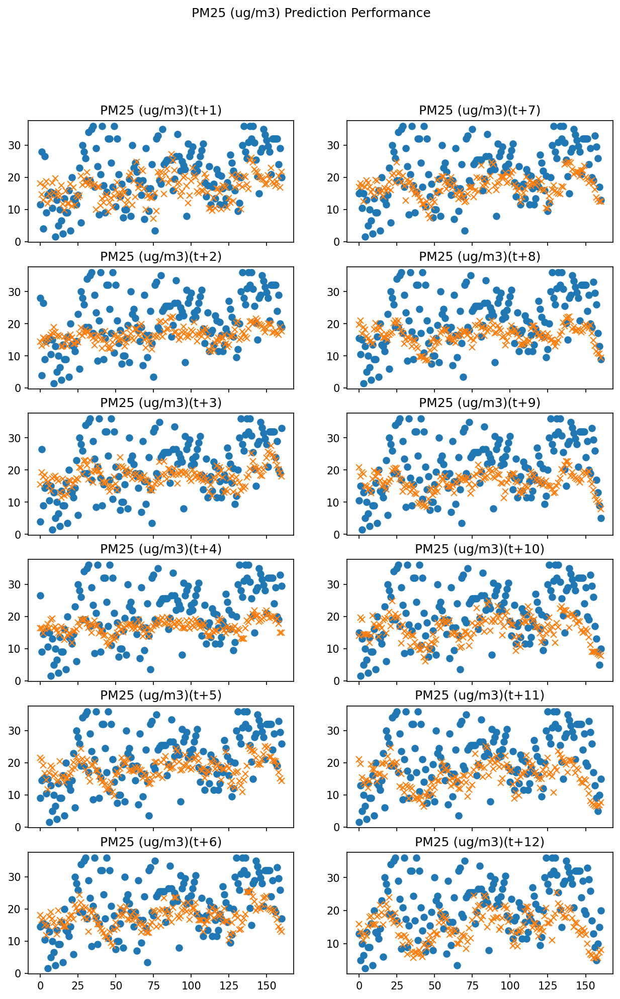

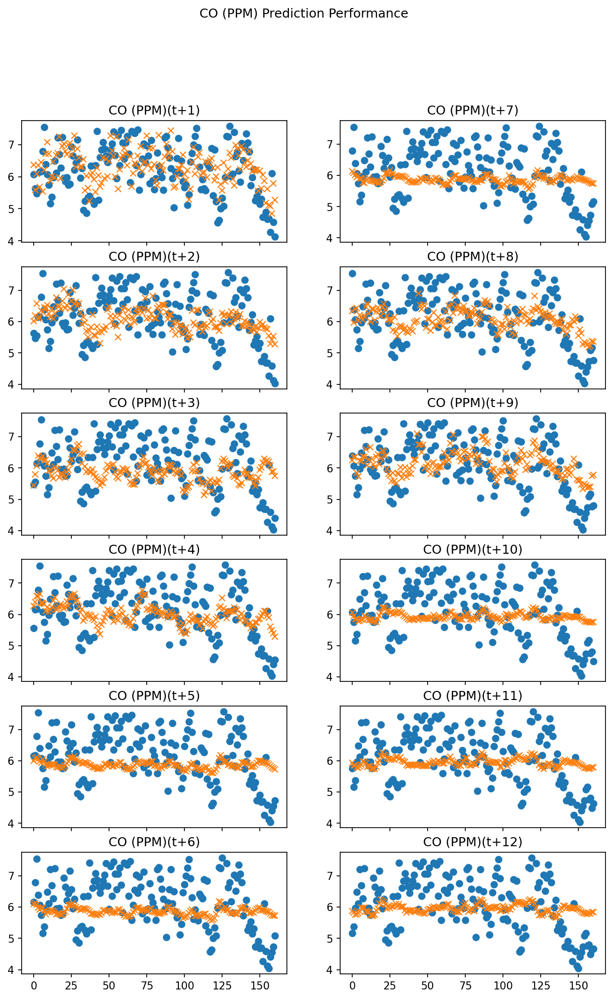

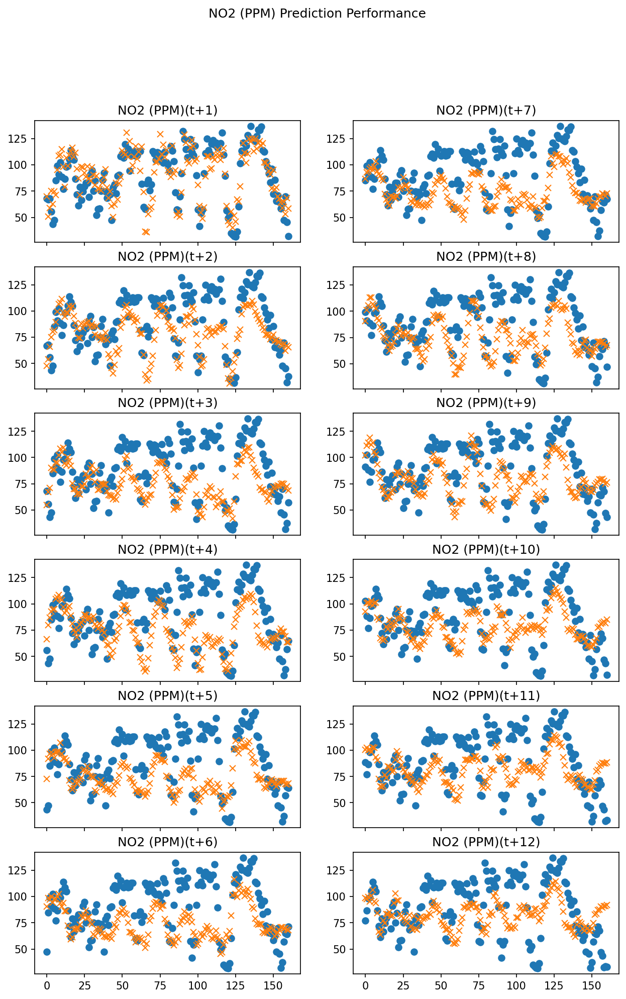

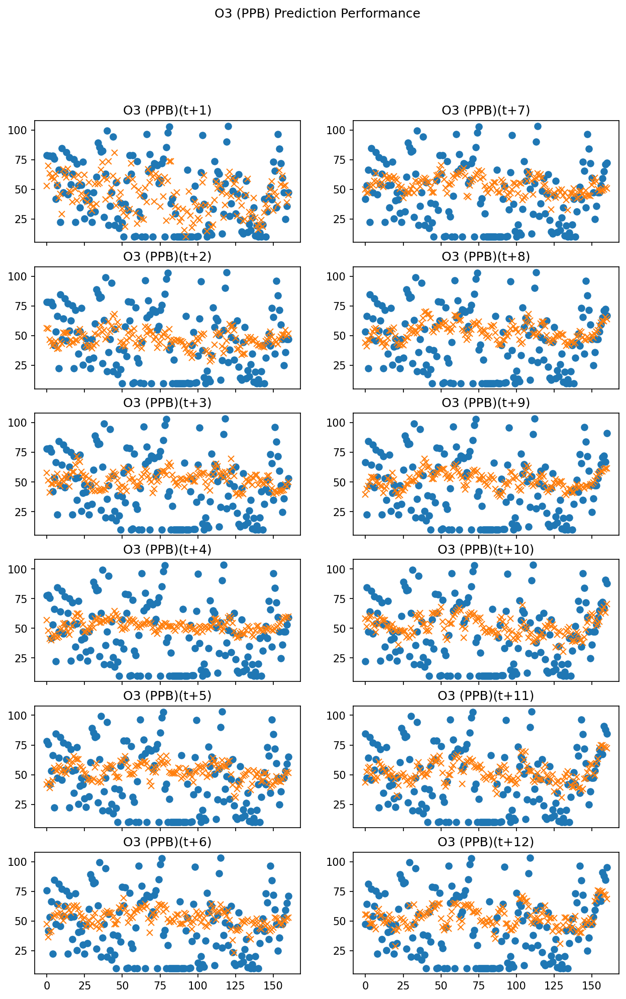

In [98]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
t = np.arange(0, len(x_test))
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        ax[row][col].set_title('{}({})'.format(label_name, time_step))
        ax[row][col].plot(t, y_test_time, 'o')
        ax[row][col].plot(t, y_pred_time, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Save the model for later use

In [99]:
import os

In [100]:
root_folder = 'ml_models_ts_singleton'
model_name = 'direct_svr'
dir_name = os.path.join(root_folder, model_name)
model_to_dump = dsvr_at_time

In [101]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(dir_name):
    try:
        os.makedirs(dir_name)
    except OSError:
        print ("Creation of the directory %s failed" % dir_name)
    else:
        print ("Successfully created the directory %s" % dir_name)
for idx, model in enumerate(model_to_dump.values()):
    file_name = '{}_t{}_model.sav'.format(model_name, idx + 1)
    file_path = os.path.join(dir_name, file_name)
    joblib.dump(model, file_path)
    print('Dumped model into file ({})'.format(file_path))
print('done!')

Dumped model into file (ml_models_ts_singleton\direct_svr\direct_svr_t1_model.sav)
Dumped model into file (ml_models_ts_singleton\direct_svr\direct_svr_t2_model.sav)
Dumped model into file (ml_models_ts_singleton\direct_svr\direct_svr_t3_model.sav)
Dumped model into file (ml_models_ts_singleton\direct_svr\direct_svr_t4_model.sav)
Dumped model into file (ml_models_ts_singleton\direct_svr\direct_svr_t5_model.sav)
Dumped model into file (ml_models_ts_singleton\direct_svr\direct_svr_t6_model.sav)
Dumped model into file (ml_models_ts_singleton\direct_svr\direct_svr_t7_model.sav)
Dumped model into file (ml_models_ts_singleton\direct_svr\direct_svr_t8_model.sav)
Dumped model into file (ml_models_ts_singleton\direct_svr\direct_svr_t9_model.sav)
Dumped model into file (ml_models_ts_singleton\direct_svr\direct_svr_t10_model.sav)
Dumped model into file (ml_models_ts_singleton\direct_svr\direct_svr_t11_model.sav)
Dumped model into file (ml_models_ts_singleton\direct_svr\direct_svr_t12_model.sav)
d

### try to load model

In [126]:
import os

In [127]:
loaded_model = {}
root_folder = 'ml_models_ts_singleton'
model_name = 'direct_svr'
dir_name = os.path.join(root_folder, model_name)

In [53]:
for time_idx in range(1, 13, 1):
    file_name = '{}_t{}_model.sav'.format(model_name, time_idx)
    file_path = os.path.join(dir_name, file_name)
    if os.path.exists(file_path):
        loaded_model['t+{}'.format(time_idx)] = joblib.load(file_path)
        print('Loaded model from file {}'.format(file_name))
    else:
        continue
if loaded_model:
    dsvr_at_time = loaded_model
else:
    print('warning! nothing loaded in model.')
print('done!')

Loaded model from file direct_svr_t1_model.sav
Loaded model from file direct_svr_t2_model.sav
Loaded model from file direct_svr_t3_model.sav
Loaded model from file direct_svr_t4_model.sav
Loaded model from file direct_svr_t5_model.sav
Loaded model from file direct_svr_t6_model.sav
Loaded model from file direct_svr_t7_model.sav
Loaded model from file direct_svr_t8_model.sav
Loaded model from file direct_svr_t9_model.sav
Loaded model from file direct_svr_t10_model.sav
Loaded model from file direct_svr_t11_model.sav
Loaded model from file direct_svr_t12_model.sav
done!


## Recurrent Support Vector Regression (R-SVR)
- We use MFs and APCs at (t - 1) + n in predicting the t + n  MFs and APCs
- We use 'rbf' kernel for consistency as in Direct SVR

In [103]:
from sklearn.svm import SVR, SVC
from sklearn.metrics import make_scorer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.multioutput import RegressorChain

### Model Tuning (GridSearch)

In [104]:
C = [ 1, 10, 100, 1000, 10000, 100000  ]
epsilon = [ 0.001, 0.01, 0.1, 1, 10 ]
gamma = [ float('1e-{}'.format(x)) for x in range(1, 10) ]
gamma.append('scale')
gamma.append('auto')

rsvr_base_name = 'multirsvr__base_estimator'
rsvr_params_grid = {
        '{}__C'.format(rsvr_base_name): C,
        '{}__epsilon'.format(rsvr_base_name): epsilon,
        '{}__gamma'.format(rsvr_base_name): gamma
    }

In [107]:
def get_estimator():
    rsvr_pipe = Pipeline([
            ('scaler', StandardScaler()),
            ('powtrans', PowerTransformer()),
            ('multirsvr', RegressorChain(base_estimator=SVR(kernel='rbf')))])
    # determine best parameters using GridSearchCV
    cv_rsvr = GridSearchCV(
        estimator=rsvr_pipe,
        param_grid=rsvr_params_grid,
        cv=TimeSeriesSplit(max_train_size=None, n_splits=5), scoring='neg_root_mean_squared_error', verbose=1, n_jobs=-1)
    return cv_rsvr

In [108]:
rsvr_model = None
rsvr_best_params = None
rsvr_cv = get_estimator()
x_train = x_train_at_time['t+1']
y_train = y_train_at_time['t+1']
# fit models
print('fitting model...')
rsvr_cv.fit(x_train, y_train)

# add models to list
rsvr_model = rsvr_cv.best_estimator_
rsvr_best_params = rsvr_cv.best_params_
print('done fitting models!!!')

fitting model...
Fitting 5 folds for each of 330 candidates, totalling 1650 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 1650 out of 1650 | elapsed:  2.7min finished


done fitting models!!!


In [198]:
# build predictor
rsvr_predictor = RecurrentPredictor(rsvr_model)

In [110]:
# see best parameters
for param_name, param_val in rsvr_best_params.items():
    print('{} : {}'.format(param_name, param_val))

multirsvr__base_estimator__C : 100000
multirsvr__base_estimator__epsilon : 1
multirsvr__base_estimator__gamma : 1e-06


In [199]:
# get all predictions for the test set
predictor = rsvr_predictor
x_test = x_test_at_time['t+1']
y_predicted = {}
for time_step in x_test_at_time:
    time_step_num = int(time_step.split('+')[1])
    preds = predictor.predict(x_test, time_step_num)
    y_predicted[time_step] = preds

### RMSE

In [200]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]
for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('RMSE for {}'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for PM25 (ug/m3)
Model(t+1): 8.940957672300172
Model(t+2): 9.144509462021187
Model(t+3): 9.27682933817814
Model(t+4): 9.482399026462225
Model(t+5): 9.642739982928846
Model(t+6): 9.705519022448705
Model(t+7): 9.655937570540816
Model(t+8): 9.648403394713407
Model(t+9): 9.512535498252822
Model(t+10): 9.516536978723806
Model(t+11): 9.450032816656538
Model(t+12): 9.297997083171655
RMSE for CO (PPM)
Model(t+1): 0.7485187858891074
Model(t+2): 0.8923768445611326
Model(t+3): 0.9822265482728503
Model(t+4): 1.0741576204076868
Model(t+5): 1.2243661241112758
Model(t+6): 1.469742532633162
Model(t+7): 1.81889405164427
Model(t+8): 2.0788245172730084
Model(t+9): 2.226436415284356
Model(t+10): 2.212751293046206
Model(t+11): 2.0946637334597464
Model(t+12): 1.9966329367453004
RMSE for NO2 (PPM)
Model(t+1): 21.046459197587534
Model(t+2): 26.419407873253608
Model(t+3): 31.184619769067762
Model(t+4): 35.03204610951718
Model(t+5): 39.094140427715786
Model(t+6): 43.77098553025195
Model(t+7): 48.4942401012

### PLCC

In [93]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('PLCC for {}'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for PM25 (ug/m3)
Model(t+1): (0.4029180946757993, 1.1645214469157155e-07)
Model(t+2): (0.34522409845413954, 7.293479057122187e-06)
Model(t+3): (0.3116099911346765, 5.7283866123333075e-05)
Model(t+4): (0.22966614503008803, 0.0033818962214732383)
Model(t+5): (0.11108771746373908, 0.16064421180806537)
Model(t+6): (0.0391504773888977, 0.6219544577360664)
Model(t+7): (0.0017372670147086568, 0.9825502964861845)
Model(t+8): (0.0027724072311108537, 0.9721563953771093)
Model(t+9): (0.020291050103379397, 0.7983487257268389)
Model(t+10): (-0.06397613790748043, 0.42008866995679955)
Model(t+11): (-0.08606279704761743, 0.27769092174879567)
Model(t+12): (-0.10421372523758818, 0.1883063726600873)
PLCC for CO (PPM)
Model(t+1): (0.3921700533742079, 2.676317210963936e-07)
Model(t+2): (0.10783920333113386, 0.17331197354864536)
Model(t+3): (-0.0448368130565203, 0.5722325165846759)
Model(t+4): (-0.0934254884653086, 0.2384858305002897)
Model(t+5): (-0.08355905174928066, 0.2919614814383807)
Model(t+6): (

### Plot the performance of the model

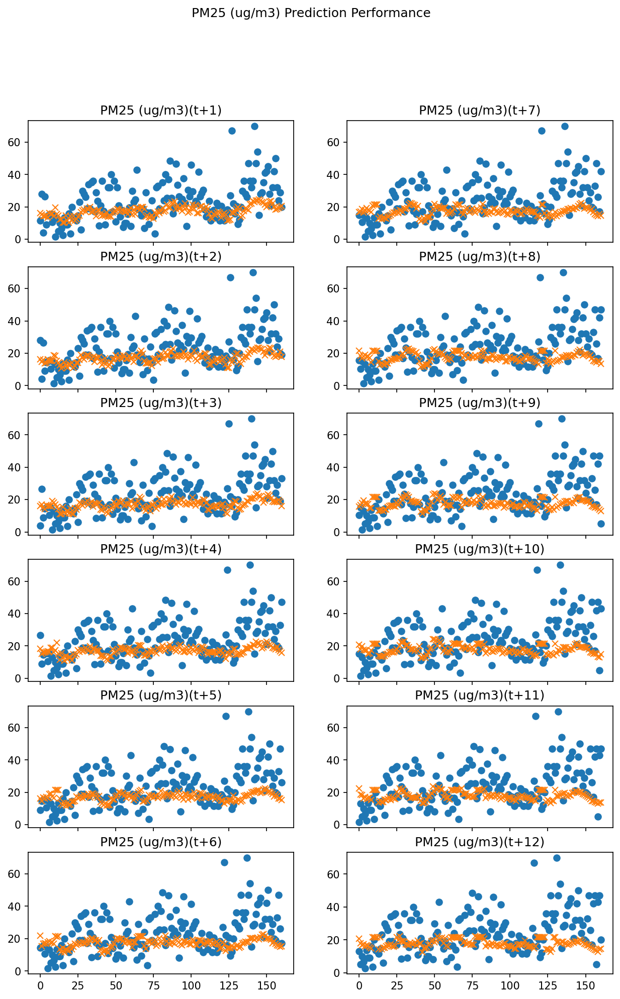

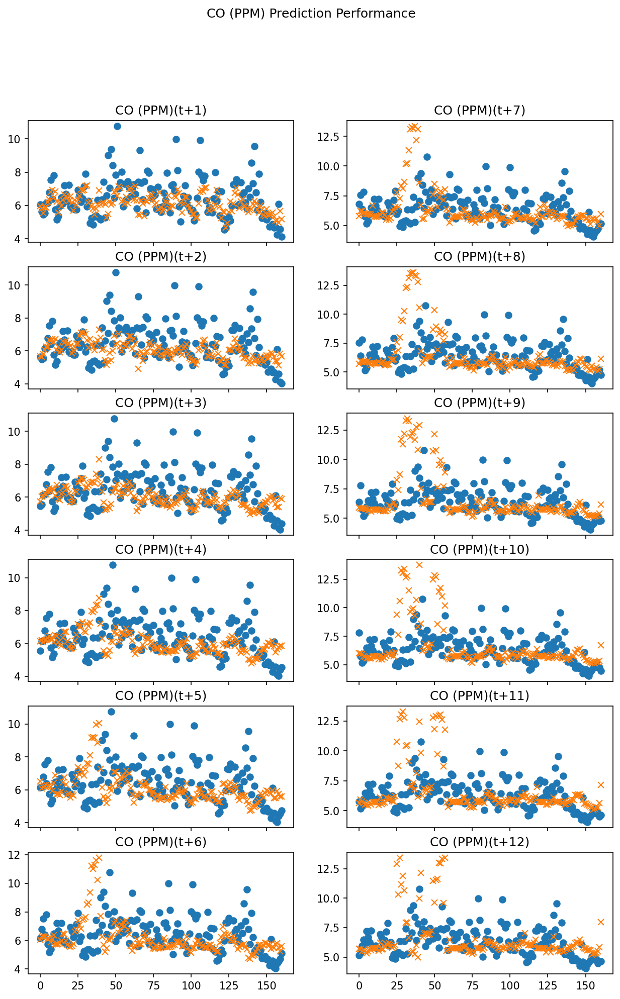

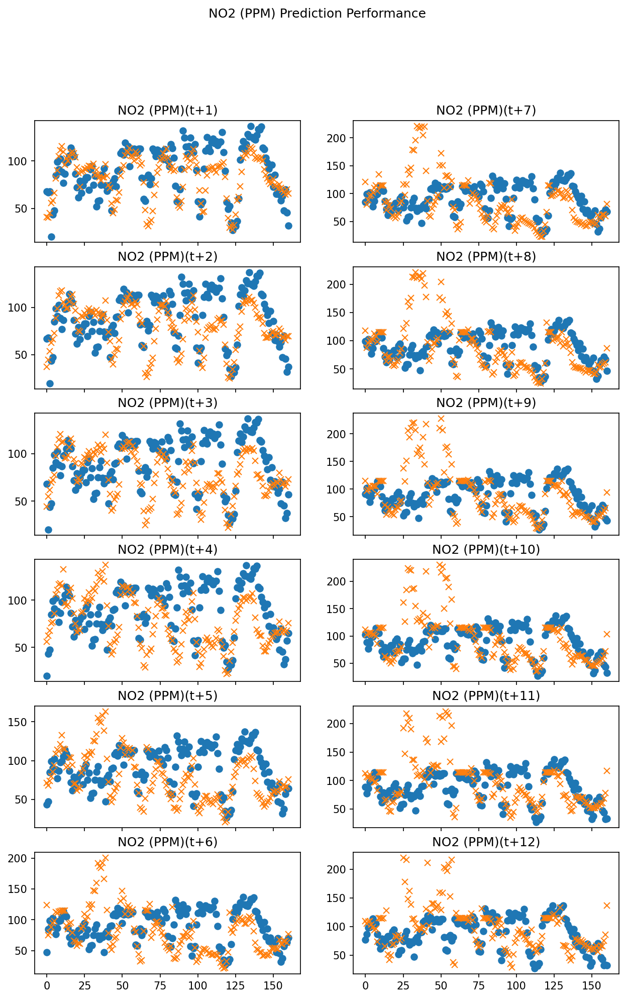

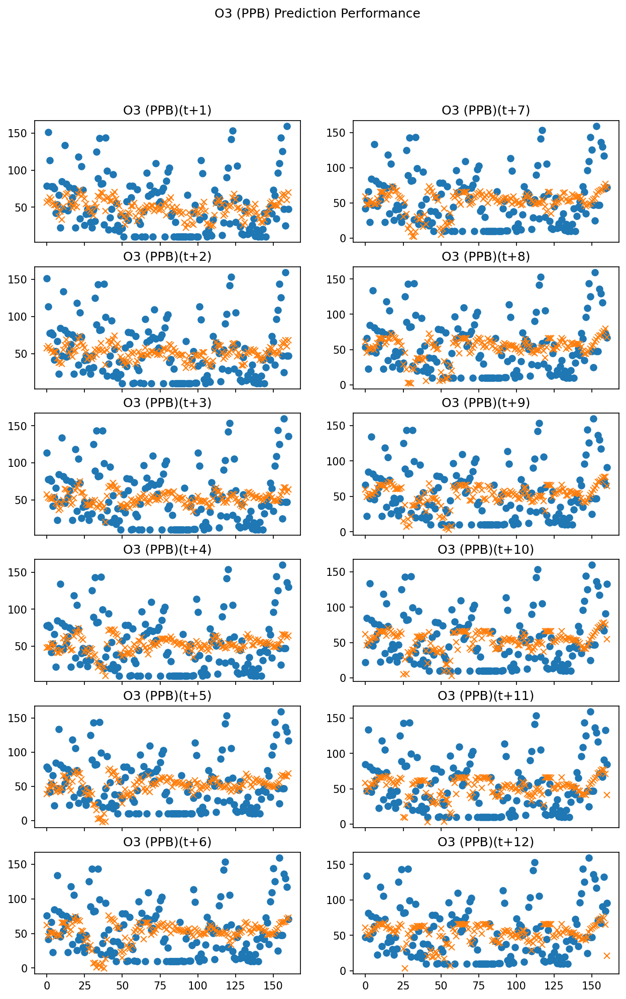

In [94]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]
t = np.arange(0, len(x_test))

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        ax[row][col].set_title('{}({})'.format(label_name, time_step))
        ax[row][col].plot(t, y_test_time, 'o')
        ax[row][col].plot(t, y_pred_time, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Save the model for later use

In [95]:
import os

In [96]:
root_folder = 'ml_models_ts_singleton'
model_name = 'rsvr'
dir_name = os.path.join(root_folder, model_name)
model_to_dump = rsvr_model

In [97]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(dir_name):
    try:
        os.makedirs(dir_name)
    except OSError:
        print ("Creation of the directory %s failed" % dir_name)
    else:
        print ("Successfully created the directory %s" % dir_name)
file_name = '{}_model.sav'.format(model_name)
file_path = os.path.join(dir_name, file_name)
joblib.dump(model_to_dump, file_path)
print('Dumped model into file ({})'.format(file_path))
print('done!')

Dumped model into file (ml_models_ts_singleton\rsvr\rsvr_model.sav)
done!


### try to load model

In [194]:
import os

In [195]:
loaded_model = None
root_folder = 'ml_models_ts_singleton'
model_name = 'rsvr'
dir_name = os.path.join(root_folder, model_name)

In [196]:
file_name = '{}_model.sav'.format(model_name)
file_path = os.path.join(dir_name, file_name)
if os.path.exists(file_path):
    loaded_model = joblib.load(file_path)
    print('Loaded model from file {}'.format(file_name))
else:
    print('Model not found.')
if not loaded_model:
    print('warning! nothing loaded in model.')
else:
    rsvr_model = loaded_model
print('done!')

Loaded model from file rsvr_model.sav
done!


## Random Forest
Advantage of RF is that it supports multi-output regression without any configs required

In [112]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, TimeSeriesSplit

### Model Tuning (Randomized)

In [115]:
# Parameters for model tuning
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt', 'log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 4, 16]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [116]:
def get_estimator():
    rf_estimator = RandomForestRegressor()
    # random search best parameters using RandomizedSearchCV
    rf_random = RandomizedSearchCV(estimator = rf_estimator,
                                   param_distributions = random_grid, 
                                   n_iter=100, cv=TimeSeriesSplit(max_train_size=None, n_splits=5), verbose=2, random_state=42, n_jobs = -1)
    return rf_random

In [117]:
rf_model = None
rf_best_params = None
rf_optimizer = get_estimator()
x_train = x_train_at_time['t+1']
y_train = y_train_at_time['t+1']
print('fitting model...') 
rf_optimizer.fit(x_train, y_train)
rf_model = rf_optimizer.best_estimator_
rf_best_params = rf_optimizer.best_params_
print('done fitting model!')

fitting model...
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  7.0min finished


done fitting model!


In [118]:
# see best parameters
for param, value in rf_best_params.items():
    print('{} : {}'.format(param, value))

n_estimators : 1400
min_samples_split : 2
min_samples_leaf : 2
max_features : sqrt
max_depth : None
bootstrap : False


### Model Tuning (GridSearch, reduced parameters after doing randomized tuning)

In [119]:
# narrowed down parameters for gridsearch based on RandomSearchCv results
n_estimators = [int(x) for x in np.linspace(start = 600, stop = 1600, num = 5)]
max_features = ['sqrt', 'log2']
max_depth = [int(x) for x in np.linspace(10, 50, num = 5)]

# Create the random grid
gs_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth}

In [120]:
def get_estimator():
    rf_estimator = RandomForestRegressor(min_samples_split = 2, min_samples_leaf = 2, 
                                        bootstrap = False)
    # random search best parameters using RandomizedSearchCV
    rf_gs = GridSearchCV(estimator=rf_estimator, param_grid=gs_grid, scoring='neg_root_mean_squared_error',
                          cv=TimeSeriesSplit(max_train_size=None, n_splits=3), n_jobs=-1, verbose=2)
    return rf_gs

In [101]:
rf_model = None
rf_best_params = {}
rf_optimizer = get_estimator()
x_train = x_train_at_time['t+1']
y_train = y_train_at_time['t+1']
print('fitting model...') 
rf_optimizer.fit(x_train, y_train)
rf_model = rf_optimizer.best_estimator_
rf_best_params = rf_optimizer.best_params_
print('done fitting model!')

fitting model...
Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:   10.0s
[Parallel(n_jobs=10)]: Done 150 out of 150 | elapsed:  1.1min finished


done fitting model!


In [102]:
# see best parameters
for param, value in rf_best_params.items():
    print('{} : {}'.format(param, value))

max_depth : 20
max_features : sqrt
n_estimators : 1350


In [121]:
# build predictor
rf_predictor = RecurrentPredictor(rf_model)

In [122]:
# get all predictions for the test set
predictor = rf_predictor
x_test = x_test_at_time['t+1']
y_predicted = {}
for time_step in x_test_at_time:
    time_step_num = int(time_step.split('+')[1])
    preds = predictor.predict(x_test, time_step_num)
    y_predicted[time_step] = preds

### RMSE

In [123]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('RMSE for {}'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for PM25 (ug/m3)
Model(t+1): 9.528277352349368
Model(t+2): 9.580800825756532
Model(t+3): 9.724514157602759
Model(t+4): 9.879271173740808
Model(t+5): 9.995846444886368
Model(t+6): 10.040683756772523
Model(t+7): 10.116347845061423
Model(t+8): 10.206840872219948
Model(t+9): 10.263164790805941
Model(t+10): 10.293164331423446
Model(t+11): 10.392630571184295
Model(t+12): 10.47652170469538
RMSE for CO (PPM)
Model(t+1): 0.880747295115762
Model(t+2): 0.9756216164493832
Model(t+3): 1.0208002966201555
Model(t+4): 1.0562273972988347
Model(t+5): 1.0894446459566913
Model(t+6): 1.109690318079862
Model(t+7): 1.1202588584589432
Model(t+8): 1.116063420977623
Model(t+9): 1.0926960821811813
Model(t+10): 1.0839404625257516
Model(t+11): 1.0808282911835578
Model(t+12): 1.0921252697332442
RMSE for NO2 (PPM)
Model(t+1): 18.70086215847481
Model(t+2): 23.081527829287484
Model(t+3): 26.14067549639962
Model(t+4): 28.33484717404292
Model(t+5): 30.003809251854992
Model(t+6): 30.8376998891333
Model(t+7): 31.4293

### PLCC

In [124]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('PLCC for {}'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for PM25 (ug/m3)
Model(t+1): (0.34721884073427767, 6.404168536799224e-06)
Model(t+2): (0.38124345078828703, 6.053797200209805e-07)
Model(t+3): (0.3729192606198723, 1.1055673893905305e-06)
Model(t+4): (0.3642116465535731, 2.0394248660486494e-06)
Model(t+5): (0.30555042931697124, 8.098228920178054e-05)
Model(t+6): (0.29211875862691206, 0.00016988560924492772)
Model(t+7): (0.2714792574153895, 0.000494901743667119)
Model(t+8): (0.2586357285488452, 0.0009240058552244795)
Model(t+9): (0.252878361270479, 0.0012103374081027089)
Model(t+10): (0.24489403888911304, 0.0017423477871492522)
Model(t+11): (0.207858937121523, 0.008148684685290017)
Model(t+12): (0.19960256262819268, 0.011131717024689885)
PLCC for CO (PPM)
Model(t+1): (0.31015927246587033, 6.227696415908086e-05)
Model(t+2): (0.1546461050858689, 0.05014212051936968)
Model(t+3): (0.13253044829386867, 0.09375368551527734)
Model(t+4): (0.19294387930704845, 0.014198786375038717)
Model(t+5): (0.2516689989536742, 0.0012799592172826513)
Mod

### Plot the performance of the model

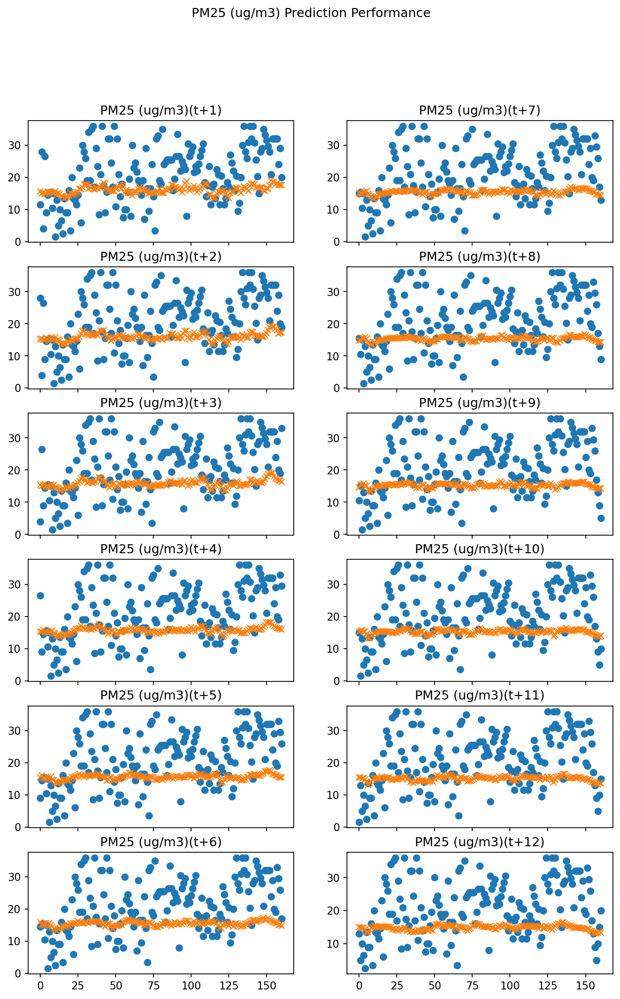

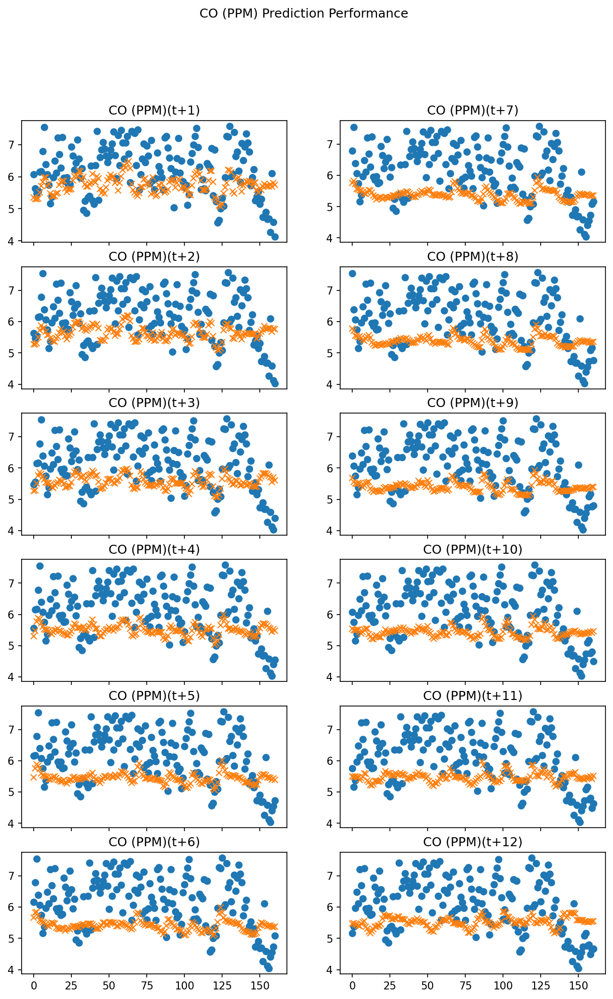

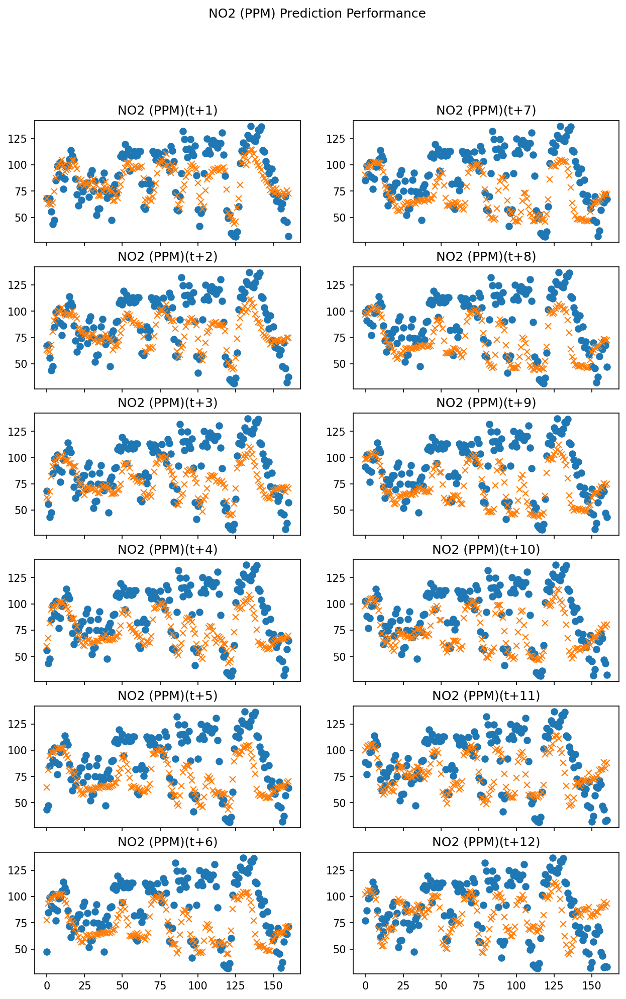

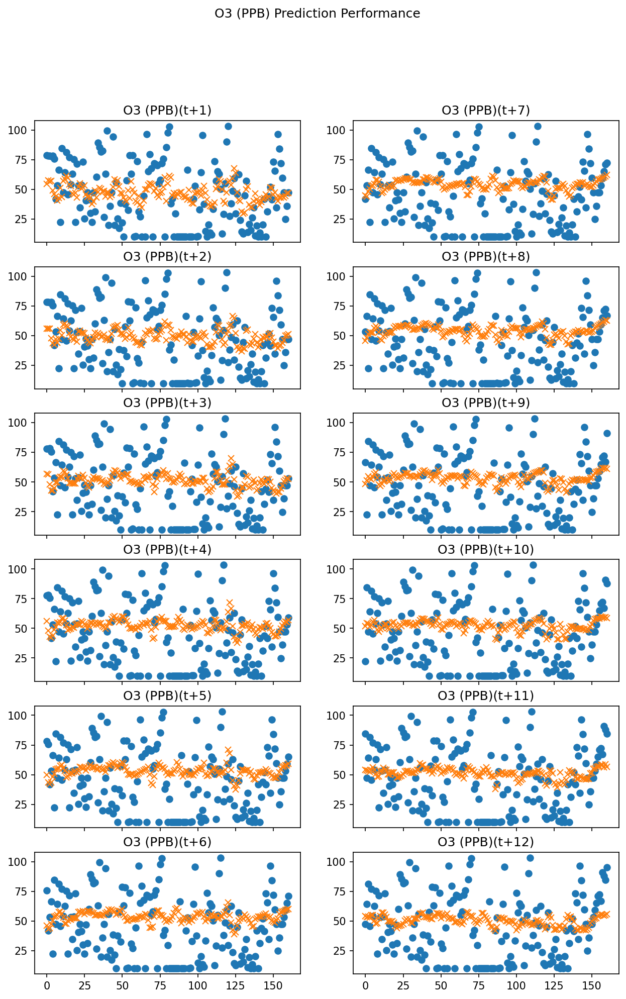

In [125]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
t = np.arange(0, len(x_test_at_time['t+1']))
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        ax[row][col].set_title('{}({})'.format(label_name, time_step))
        ax[row][col].plot(t, y_test_time, 'o')
        ax[row][col].plot(t, y_pred_time, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Save the model for later use

In [126]:
import os

In [127]:
root_folder = 'ml_models_ts_singleton'
model_name = 'random_forest'
dir_name = os.path.join(root_folder, model_name)
model_to_dump = rf_model

In [128]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(dir_name):
    try:
        os.makedirs(dir_name)
    except OSError:
        print ("Creation of the directory %s failed" % dir_name)
    else:
        print ("Successfully created the directory %s" % dir_name)
file_name = '{}_model.sav'.format(model_name)
file_path = os.path.join(dir_name, file_name)
joblib.dump(model_to_dump, file_path)
print('Dumped model into file ({})'.format(file_path))
print('done!')

Dumped model into file (ml_models_ts_singleton\random_forest\random_forest_model.sav)
done!


### try to load model

In [ ]:
import os

In [ ]:
loaded_model = None
root_folder = 'ml_models_ts_singleton'
model_name = 'random_forest'
dir_name = os.path.join(root_folder, model_name)

In [ ]:
file_name = '{}_model.sav'.format(model_name)
file_path = os.path.join(dir_name, file_name)
if os.path.exists(file_path):
    loaded_model = joblib.load(file_path)
    print('Loaded model from file {}'.format(file_name))
else:
    print('Model does not exist.')
if not loaded_model:
    print('warning! nothing loaded in model.')
else:
    rf_model = loaded_model
print('done!')

## Stochastic Gradient Boosting (SGD Trees)

In [132]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, TimeSeriesSplit
from sklearn.multioutput import RegressorChain
from sklearn.pipeline import Pipeline

### Model Tuning (Randomized)

In [133]:
# loss function to use
loss = [ 'ls', 'lad', 'huber' ]
# learning rate shrinks the contribution of each tree
learning_rate = [ 0.1, 0.15, 0.2 ]
# the number of boosting stages to perform.
n_estimators = [ int(x) for x in np.linspace(start = 100, stop = 2000, num = 20) ]
# The fraction of samples to be used for fitting the individual base learners
subsample = [ 0.2, 0.4, 0.8, 0.9 ]
# The minimum number of samples required to split an internal node
min_samples_split = [ 2, 4, 8, 16 ]
# The minimum number of samples required to be at a leaf node
min_samples_leaf = [ 1, 2, 4, 8 ]
# maximum depth of the individual regression estimators.
max_depth = [ int(x) for x in np.linspace(start = 3, stop = 30, num = 10) ]
# The number of features to consider when looking for the best split:
max_features = [ 'auto', 'sqrt', 'log2' ]

# Create the grid
estimator_name = 'sgb__base_estimator'
sgb_grid = {'{}__loss'.format(estimator_name): loss,
              '{}__learning_rate'.format(estimator_name): learning_rate,
               '{}__n_estimators'.format(estimator_name): n_estimators,
               '{}__subsample'.format(estimator_name): subsample,
               '{}__min_samples_split'.format(estimator_name): min_samples_split,
               '{}__min_samples_leaf'.format(estimator_name): min_samples_leaf,
               '{}__max_depth'.format(estimator_name): max_depth,
               '{}__max_features'.format(estimator_name): max_features
              }

In [134]:
def get_estimator():
    sgb_pipe = Pipeline([
            ('scaler', StandardScaler()),
            ('powtrans', PowerTransformer()),
            ('sgb', RegressorChain(base_estimator=GradientBoostingRegressor()))])
    sgb_optimizer = RandomizedSearchCV(estimator = sgb_pipe,
                                   param_distributions = sgb_grid, scoring='neg_root_mean_squared_error',
                                   n_iter=100, cv=TimeSeriesSplit(max_train_size=None, n_splits=5), verbose=2, 
                                       random_state=42, n_jobs=-1)
    return sgb_optimizer

In [135]:
sgb_model = None
sgb_best_params = {}
sgb_optimizer = get_estimator()
x_train = x_train_at_time['t+1']
y_train = y_train_at_time['t+1']
print('fitting model...') 
sgb_optimizer.fit(x_train, y_train)
sgb_model = sgb_optimizer.best_estimator_
sgb_best_params = sgb_optimizer.best_params_
print('done fitting model!')

fitting model...
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed: 35.0min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 56.1min finished


done fitting model!


In [136]:
#see best params
for param, val in sgb_best_params.items():
    print('{} : {}'.format(param, val))

sgb__base_estimator__subsample : 0.8
sgb__base_estimator__n_estimators : 200
sgb__base_estimator__min_samples_split : 8
sgb__base_estimator__min_samples_leaf : 8
sgb__base_estimator__max_features : auto
sgb__base_estimator__max_depth : 15
sgb__base_estimator__loss : lad
sgb__base_estimator__learning_rate : 0.1


In [74]:
# build predictor
sgb_predictor = RecurrentPredictor(sgb_model)

In [75]:
# get all predictions for the test set
predictor = sgb_predictor
x_test = x_test_at_time['t+1']
y_predicted = {}
for time_step in x_test_at_time:
    time_step_num = int(time_step.split('+')[1])
    preds = predictor.predict(x_test, time_step_num)
    y_predicted[time_step] = preds

### Model Tuning (GridSearch, reduced parameters after doing randomized tuning)

In [112]:
loss = [ 'ls', 'lad', 'huber' ]
learning_rate = [ 0.1 ]
n_estimators = [ int(x) for x in np.linspace(start = 200, stop = 800, num = 4) ]
subsample = [ 0.5, 0.8, 0.9 ]
min_samples_split = [ 8 ]
min_samples_leaf = [ 8 ]
max_depth = [ int(x) for x in np.linspace(start = 10, stop = 30, num = 3) ]
max_features = [ 'auto', 'sqrt', 'log2' ]

estimator_name = 'sgb__base_estimator'
sgb_grid = {'{}__loss'.format(estimator_name): loss,
              '{}__learning_rate'.format(estimator_name): learning_rate,
               '{}__n_estimators'.format(estimator_name): n_estimators,
               '{}__subsample'.format(estimator_name): subsample,
               '{}__min_samples_split'.format(estimator_name): min_samples_split,
               '{}__min_samples_leaf'.format(estimator_name): min_samples_leaf,
               '{}__max_depth'.format(estimator_name): max_depth,
               '{}__max_features'.format(estimator_name): max_features
              }

In [113]:
def get_estimator():
    sgb_pipe = Pipeline([
            ('scaler', RobustScaler()),
            ('powtrans', PowerTransformer()),
            ('sgb', RegressorChain(base_estimator=GradientBoostingRegressor()))])
    cv_sgb = GridSearchCV(
        estimator=sgb_pipe,
        param_grid=sgb_grid,
        cv=TimeSeriesSplit(max_train_size=None, n_splits=5), scoring='neg_root_mean_squared_error', verbose=2, n_jobs=-1)
    return cv_sgb

In [ ]:
sgb_model = None
sgb_best_params = {}
sgb_optimizer = get_estimator()
x_train = x_train_at_time['t+1']
y_train = y_train_at_time['t+1']
print('fitting model...') 
sgb_optimizer.fit(x_train, y_train)
sgb_model = sgb_optimizer.best_estimator_
sgb_best_params = sgb_optimizer.best_params_
print('done fitting model!')

In [ ]:
#see best params
for param, val in sgb_best_params.items():
    print('{} : {}'.format(param, val))

In [ ]:
# build predictor
sgb_predictor = RecurrentPredictor(sgb_model)

In [ ]:
# get all predictions for the test set
predictor = sgb_predictor
x_test = x_test_at_time['t+1']
y_predicted = {}
for time_step in x_test_at_time:
    time_step_num = int(time_step.split('+')[1])
    preds = predictor.predict(x_test, time_step_num)
    y_predicted[time_step] = preds

### RMSE

In [76]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('RMSE for {}'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for PM25 (ug/m3)
Model(t+1): 13.185337812872053
Model(t+2): 13.467446602346115
Model(t+3): 13.696812559473805
Model(t+4): 13.679785095655248
Model(t+5): 13.891965856822717
Model(t+6): 14.003341329291485
Model(t+7): 14.22458163747278
Model(t+8): 14.565162949916925
Model(t+9): 14.247104289059722
Model(t+10): 14.586706841087839
Model(t+11): 14.708337645278739
Model(t+12): 15.04076840532661
RMSE for CO (PPM)
Model(t+1): 1.1809717667435498
Model(t+2): 1.3324187284807565
Model(t+3): 1.4057981788161067
Model(t+4): 1.4227510979751832
Model(t+5): 1.416195188615974
Model(t+6): 1.4128135817410308
Model(t+7): 1.3722961335655752
Model(t+8): 1.3440523992292963
Model(t+9): 1.323203919757645
Model(t+10): 1.2920508059568399
Model(t+11): 1.2866968074087823
Model(t+12): 1.3025853566029046
RMSE for NO2 (PPM)
Model(t+1): 16.60976050821621
Model(t+2): 24.17222178350944
Model(t+3): 28.445888120570803
Model(t+4): 30.286132957914038
Model(t+5): 32.13914880366188
Model(t+6): 32.74347266969816
Model(t+7): 3

### PLCC

In [77]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('PLCC for {}'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for PM25 (ug/m3)
Model(t+1): (0.29731810647135076, 0.00012807542916735295)
Model(t+2): (0.2469406814675288, 0.0015887434069956987)
Model(t+3): (0.1793668845042025, 0.022805753525349078)
Model(t+4): (0.19578509701578492, 0.012809771385995495)
Model(t+5): (0.11126379917729959, 0.15997792061489757)
Model(t+6): (0.04550958450088233, 0.5664757001342685)
Model(t+7): (0.009008469479446012, 0.9097005038872532)
Model(t+8): (-0.04490810184097317, 0.5716212058558012)
Model(t+9): (0.04883517489207523, 0.5384306333659179)
Model(t+10): (0.043688278199259314, 0.5821235000433091)
Model(t+11): (0.07574315888694637, 0.3395994171655649)
Model(t+12): (0.06337562776494032, 0.4244736158048133)
PLCC for CO (PPM)
Model(t+1): (0.407035157912692, 8.400466686791996e-08)
Model(t+2): (0.13147280572998138, 0.096426866616327)
Model(t+3): (0.028078296303742194, 0.723663156114081)
Model(t+4): (0.026483773916982374, 0.7387708205923927)
Model(t+5): (0.049512056102445794, 0.5328081091222224)
Model(t+6): (0.048860076

### Plot the performance of the model

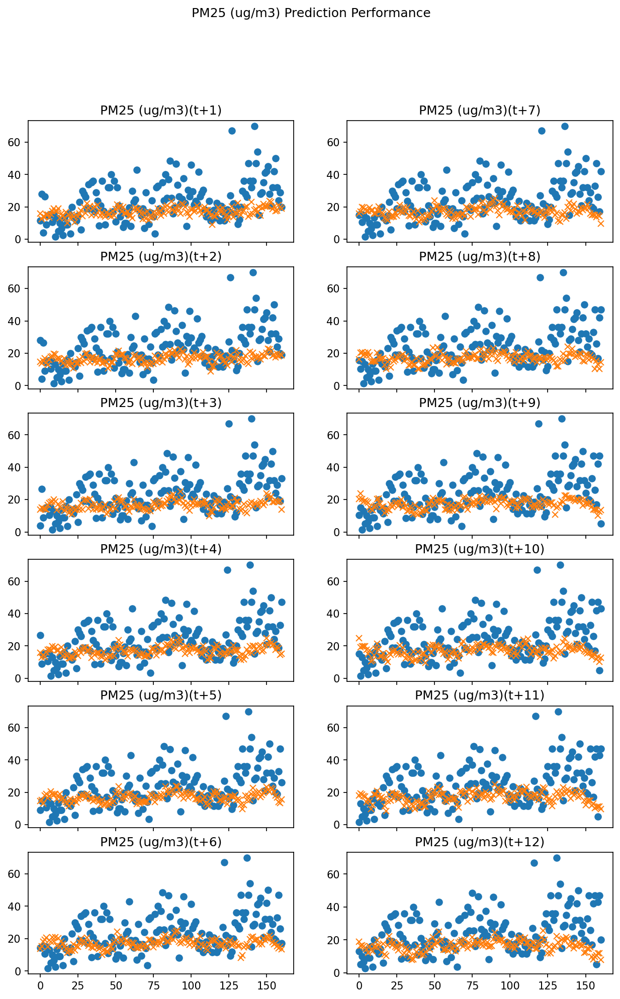

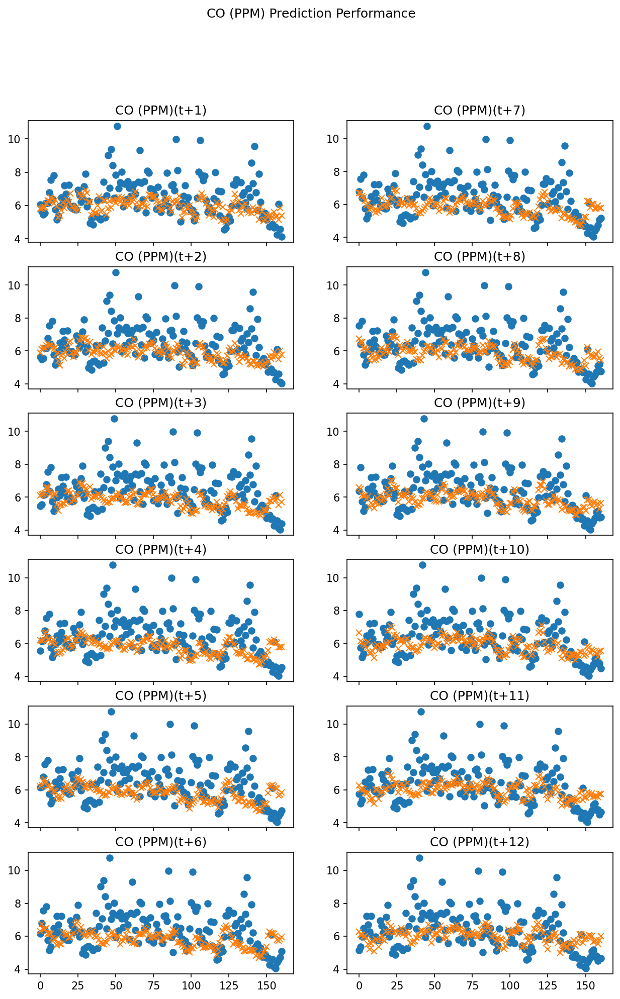

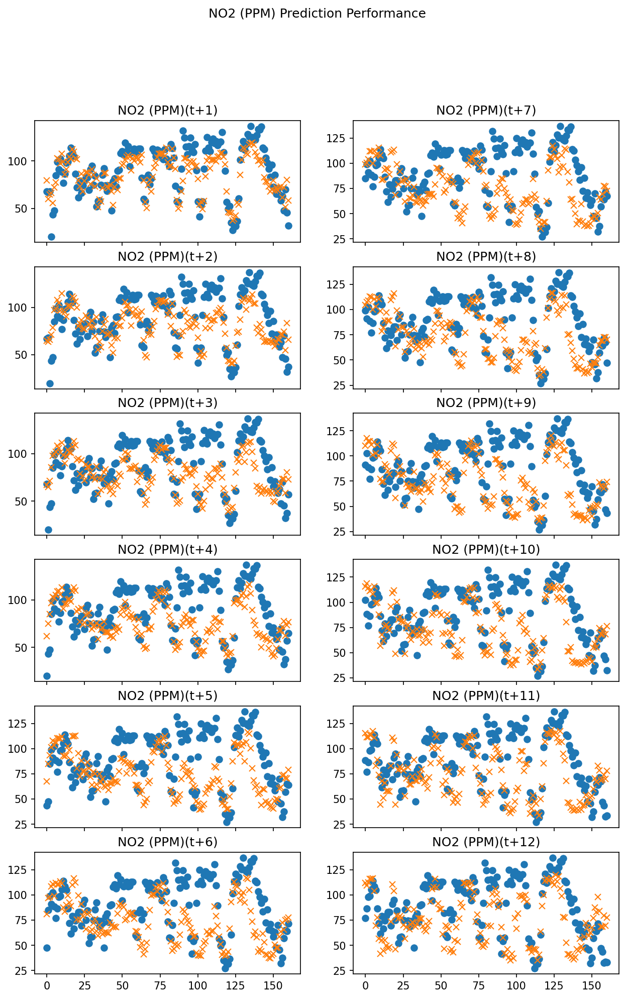

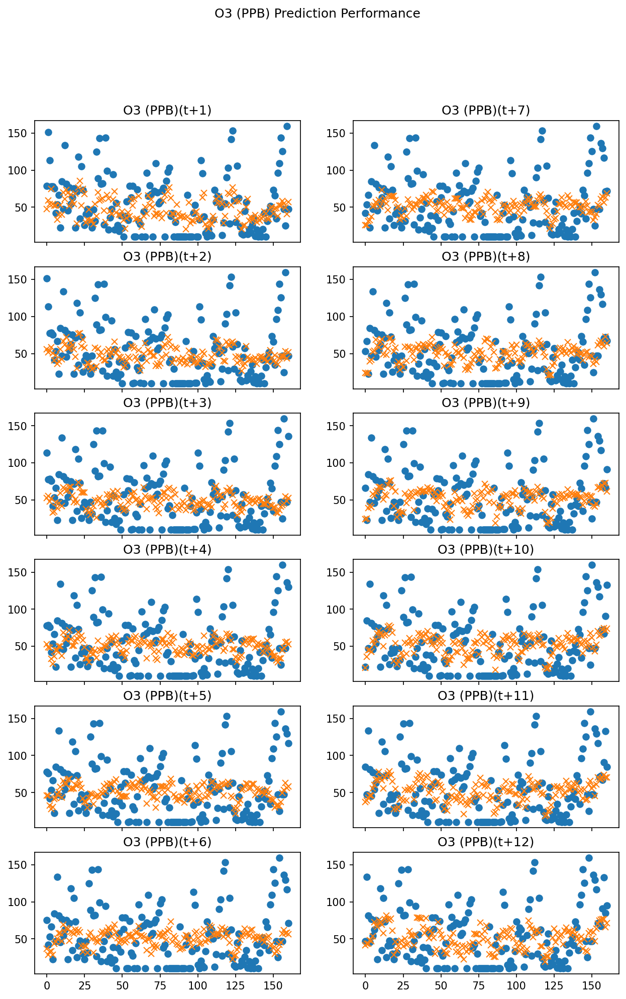

In [78]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
t = np.arange(0, len(x_test_at_time['t+1']))
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        ax[row][col].set_title('{}({})'.format(label_name, time_step))
        ax[row][col].plot(t, y_test_time, 'o')
        ax[row][col].plot(t, y_pred_time, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Save the model for later use

In [142]:
import os

In [143]:
root_folder = 'ml_models_ts_singleton'
model_name = 'sgb'
dir_name = os.path.join(root_folder, model_name)
model_to_dump = sgb_model

In [144]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(dir_name):
    try:
        os.makedirs(dir_name)
    except OSError:
        print ("Creation of the directory %s failed" % dir_name)
    else:
        print ("Successfully created the directory %s" % dir_name)
file_name = '{}_model.sav'.format(model_name)
file_path = os.path.join(dir_name, file_name)
joblib.dump(model_to_dump, file_path)
print('Dumped model into file ({})'.format(file_path))
print('done!')

Dumped model into file (ml_models_ts_singleton\sgb\sgb_model.sav)
done!


### try to load model

In [4]:
import os, joblib

In [5]:
loaded_model = None
root_folder = 'ml_models_ts_singleton'
model_name = 'sgb'
dir_name = os.path.join(root_folder, model_name)

In [6]:
file_name = '{}_model.sav'.format(model_name)
file_path = os.path.join(dir_name, file_name)
if os.path.exists(file_path):
    loaded_model = joblib.load(file_path)
    print('Loaded model from file {}'.format(file_name))
else:
    print('Model does not exist.')
if loaded_model:
    sgb_model = loaded_model
else:
    print('warning! nothing loaded in model.')
print('done!')

Loaded model from file sgb_model.sav
done!


## Nearest Neighbors Regression

In [145]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit

### Model Tuning (GridSearch)

In [146]:
n_neighbors = [ int(x) for x in np.linspace( 10, 60, 10) ]
weights = [ 'uniform', 'distance' ]
algorithm = [ 'auto', 'ball_tree', 'kd_tree', 'brute' ]
leaf_size = [ int(x) for x in np.linspace( 20, 70, 10) ]
metric_1 = [ 'euclidean', 'manhattan', 'chebyshev' ]
metric_2 = [ 'minkowski' ]
p = [ 2, 3, 4 ]
pre_estimator_name = 'nbr'
nbr_params_grid_1 = {
    '%s__n_neighbors' % pre_estimator_name: n_neighbors,
    '%s__weights' % pre_estimator_name: weights,
    '%s__algorithm' % pre_estimator_name: algorithm,
    '%s__leaf_size' % pre_estimator_name: leaf_size,
    '%s__metric' % pre_estimator_name: metric_1
}
nbr_params_grid_2 = {
    '%s__n_neighbors' % pre_estimator_name: n_neighbors,
    '%s__weights' % pre_estimator_name: weights,
    '%s__algorithm' % pre_estimator_name: algorithm,
    '%s__leaf_size' % pre_estimator_name: leaf_size,
    '%s__metric' % pre_estimator_name: metric_2,
    '%s__p' % pre_estimator_name: p
}
nbr_full_params_grid = [nbr_params_grid_1, nbr_params_grid_2]

In [147]:
def get_estimator():
    nbr_pipe = Pipeline([
            ('scaler', StandardScaler()),
            ('nbr', KNeighborsRegressor())])
    # determine best parameters using GridSearchCV
    cv_nbr = GridSearchCV(
        estimator=nbr_pipe,
        param_grid=nbr_full_params_grid,
        cv=TimeSeriesSplit(max_train_size=None, n_splits=5), scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
    return cv_nbr

In [148]:
nbr_model, nbr_best_params = None, {}
nbr_optimizer = get_estimator()
x_train = x_train_at_time['t+1']
y_train = y_train_at_time['t+1']
print('fitting model...') 
nbr_optimizer.fit(x_train, y_train)
nbr_model = nbr_optimizer.best_estimator_
nbr_best_params = nbr_optimizer.best_params_
print('done fitting model!')

fitting model...
Fitting 5 folds for each of 4800 candidates, totalling 24000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 254 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 672 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 1804 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done 3264 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 5044 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 7152 tasks      | elapsed:   34.8s
[Parallel(n_jobs=-1)]: Done 9580 tasks      | elapsed:   44.0s
[Parallel(n_jobs=-1)]: Done 12336 tasks      | elapsed:   56.8s
[Parallel(n_jobs=-1)]: Done 15412 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 18816 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 22540 tasks      | elapsed:  3.4min


done fitting model!


[Parallel(n_jobs=-1)]: Done 24000 out of 24000 | elapsed:  3.7min finished


In [149]:
# see best params
for param, val in nbr_best_params.items():
    print('{} : {}'.format(param, val))

nbr__algorithm : auto
nbr__leaf_size : 20
nbr__metric : euclidean
nbr__n_neighbors : 26
nbr__weights : distance


In [150]:
# build predictor
nbr_predictor = RecurrentPredictor(nbr_model)

In [151]:
# get all predictions for the test set
predictor = nbr_predictor
x_test = x_test_at_time['t+1']
y_predicted = {}
for time_step in x_test_at_time:
    time_step_num = int(time_step.split('+')[1])
    preds = predictor.predict(x_test, time_step_num)
    y_predicted[time_step] = preds

### RMSE

In [152]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('RMSE for {}'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for PM25 (ug/m3)
Model(t+1): 8.947368284940966
Model(t+2): 8.957606527747819
Model(t+3): 9.096652323416762
Model(t+4): 9.186061186001675
Model(t+5): 9.2165839329915
Model(t+6): 9.322295862491599
Model(t+7): 9.355986502764782
Model(t+8): 9.398892176022878
Model(t+9): 9.324274523798397
Model(t+10): 9.427505390621663
Model(t+11): 9.582388031128614
Model(t+12): 9.619628771465603
RMSE for CO (PPM)
Model(t+1): 0.7937303721718328
Model(t+2): 0.8384999460911557
Model(t+3): 0.8639151332038952
Model(t+4): 0.8848320232758908
Model(t+5): 0.9017920016955235
Model(t+6): 0.9153914494160722
Model(t+7): 0.9334209289284954
Model(t+8): 0.9452134759682258
Model(t+9): 0.9484039468735644
Model(t+10): 0.9722503445128042
Model(t+11): 0.9866785005488291
Model(t+12): 0.9857236271304715
RMSE for NO2 (PPM)
Model(t+1): 23.51300254100122
Model(t+2): 25.778882258341056
Model(t+3): 27.076903734825922
Model(t+4): 27.75614690012402
Model(t+5): 28.429329289732852
Model(t+6): 29.04989154061016
Model(t+7): 29.1938802

### PLCC

In [153]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('PLCC for {}'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for PM25 (ug/m3)
Model(t+1): (0.349509132492321, 5.509932601141511e-06)
Model(t+2): (0.35929446386891006, 2.859348240977582e-06)
Model(t+3): (0.3291729247218417, 2.011337619573762e-05)
Model(t+4): (0.3036134116045159, 9.031643232931081e-05)
Model(t+5): (0.2863019531903292, 0.00023156087720581147)
Model(t+6): (0.22631188952863282, 0.0038924184429769285)
Model(t+7): (0.25535017787111003, 0.0010786966041518291)
Model(t+8): (0.2808124083886721, 0.00030829791093011006)
Model(t+9): (0.32986175101209547, 1.9278744699236187e-05)
Model(t+10): (0.31344664139582007, 5.150045241681835e-05)
Model(t+11): (0.25790174640877356, 0.0009566817166530289)
Model(t+12): (0.24099061877688213, 0.0020733475512406552)
PLCC for CO (PPM)
Model(t+1): (0.33413543954627767, 1.4787269202197886e-05)
Model(t+2): (0.2549485392561949, 0.001099152452534223)
Model(t+3): (0.2149175919514873, 0.006184822921046874)
Model(t+4): (0.1675876078931369, 0.0335923449451871)
Model(t+5): (0.13922011803064815, 0.07818277675138854)


### Plot the performance of the model

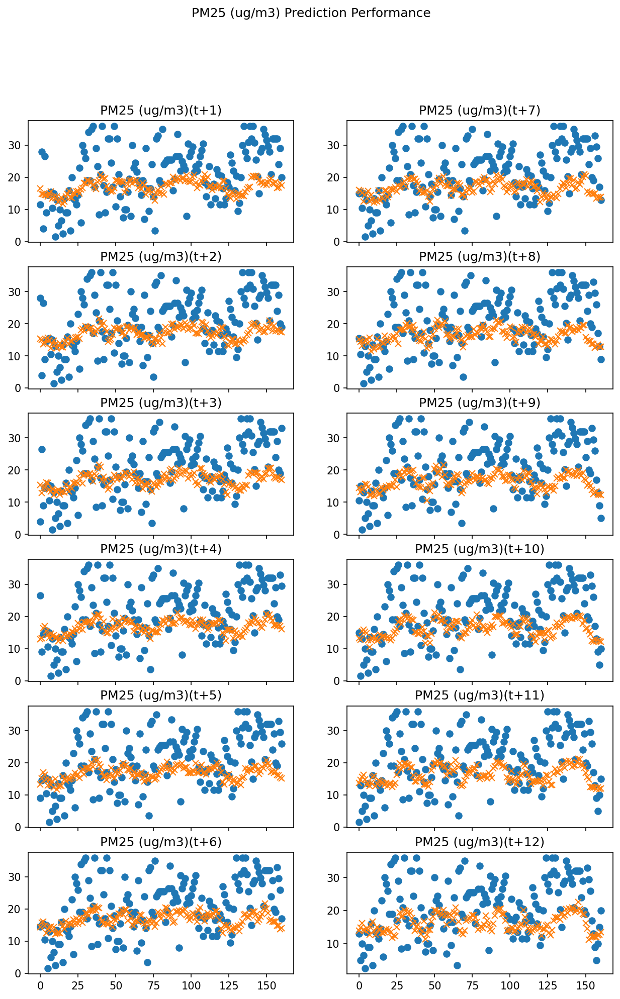

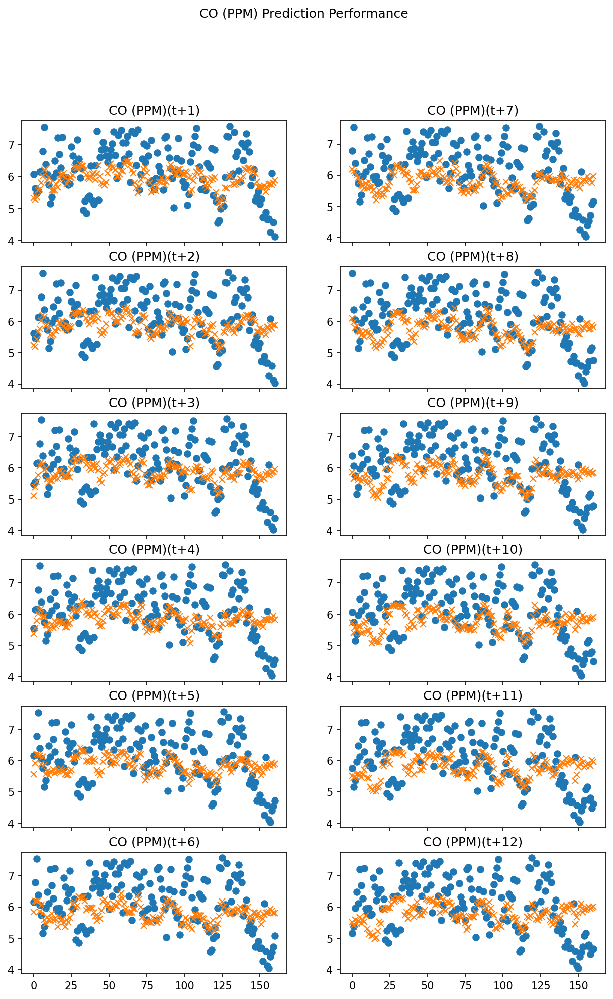

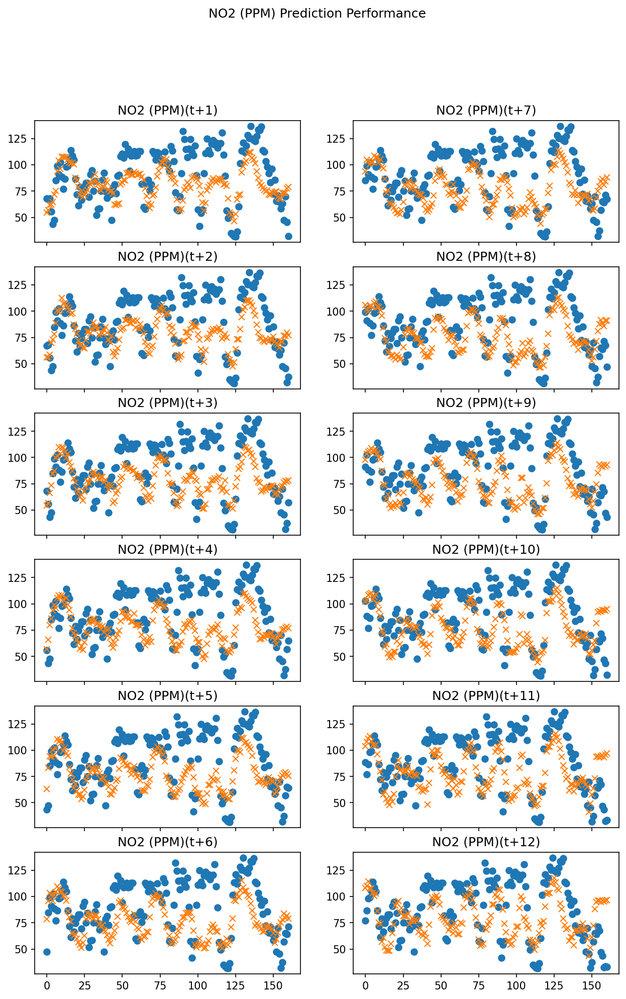

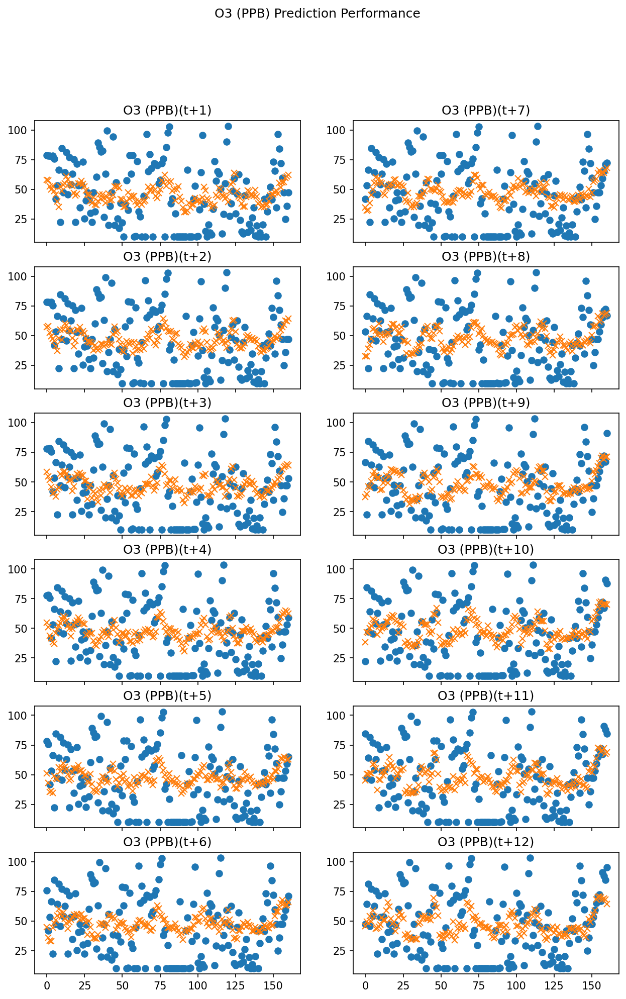

In [154]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
t = np.arange(0, len(x_test_at_time['t+1']))
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        ax[row][col].set_title('{}({})'.format(label_name, time_step))
        ax[row][col].plot(t, y_test_time, 'o')
        ax[row][col].plot(t, y_pred_time, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Save the model for later use

In [155]:
import os

In [156]:
root_folder = 'ml_models_ts_singleton'
model_name = 'nbr'
dir_name = os.path.join(root_folder, model_name)
model_to_dump = nbr_model

In [157]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(dir_name):
    try:
        os.makedirs(dir_name)
    except OSError:
        print ("Creation of the directory %s failed" % dir_name)
    else:
        print ("Successfully created the directory %s" % dir_name)
file_name = '{}_model.sav'.format(model_name)
file_path = os.path.join(dir_name, file_name)
joblib.dump(model_to_dump, file_path)
print('Dumped model into file ({})'.format(file_path))
print('done!')

Dumped model into file (ml_models_ts_singleton\nbr\nbr_model.sav)
done!


### try to load model

In [ ]:
import os

In [ ]:
loaded_model = {}
root_folder = 'ml_models_ts_singleton'
model_name = 'nbr'
dir_name = os.path.join(root_folder, model_name)

In [ ]:
file_name = '{}_model.sav'.format(model_name)
file_path = os.path.join(dir_name, file_name)
if os.path.exists(file_path):
    loaded_model = joblib.load(file_path)
    print('Loaded model from file {}'.format(file_name))
else:
    print('Model does not exist.')
if loaded_model:
    nbr_model = loaded_model
else:
    print('warning! nothing loaded in model.')
print('done!')

## Ensemble (5 Regressors)
Consists of 5 regressors:
- SVR
- R-SVR
- Random Forest
- SGD
- Nearest Neighbors

We take the mean of the predicted values of each regressor to get the final model's predicted value.

In [168]:
# learner models
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
# final meta estimator
from sklearn.linear_model import LinearRegression
# others
from mlxtend.regressor import StackingRegressor
from sklearn.multioutput import RegressorChain
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PowerTransformer

### Best parameters

In [161]:
svr_best_params = {'C' : 100000,'epsilon' : 1,'gamma' : 1e-06}

In [162]:
rf_best_params = {'n_estimators' : 1400,'min_samples_split' : 2,'min_samples_leaf' : 2,'max_features' : 'sqrt',
                    'max_depth' : None,
                    'bootstrap' : False}

In [163]:
sgb_best_params = {'subsample' : 0.8, 'n_estimators' : 200, 'min_samples_split' : 8, 'min_samples_leaf' : 8,
                    'max_features' : 'auto', 'max_depth' : 15, 'loss' : 'lad', 'learning_rate' : 0.1}

In [164]:
nbr_best_params = {'algorithm' : 'auto','leaf_size' : 20,'metric' : 'euclidean','n_neighbors' : 26,
                   'weights' : 'distance'}

In [165]:
def get_best_model(model_name):
    best_model = None
    if model_name == 'svr':
        best_model = SVR(kernel='rbf')
        best_model.set_params(**svr_best_params)
    elif model_name == 'rf':
        best_model = RandomForestRegressor()
        best_model.set_params(**rf_best_params)
    elif model_name == 'sgb':
        best_model = GradientBoostingRegressor()
        best_model.set_params(**sgb_best_params)
    elif model_name == 'nbr':
        best_model = KNeighborsRegressor()
        best_model.set_params(**nbr_best_params)
    return best_model

In [166]:
# get a stacking ensemble of models
def get_stacking_ensemble(learner_names):
    # define the base models
    learner_list = list()
    for learner_name in learner_names:
        best_model = get_best_model(learner_name)
        learner_list.append(best_model)
    # define meta learner model
#     meta_learner = KNeighborsRegressor()
#     meta_learner.set_params(**nbr_best_params)
    meta_learner = LinearRegression()
    # define the stacking ensemble
    model = StackingRegressor(regressors=learner_list, meta_regressor=meta_learner, verbose=1)
    return model

### Train best model

In [169]:
ensemble_model = {}
learning_model_names = ['svr', 'rf', 'sgb', 'nbr']
stacker = get_stacking_ensemble(learning_model_names)
stack_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('powtrans', PowerTransformer()),
    ('ensemble', stacker)
])
ensemble_chain = RegressorChain(base_estimator=stack_pipe)
x_train = x_train_at_time['t+1']
y_train = y_train_at_time['t+1']
print('fitting model...')
ensemble_chain.fit(x_train, y_train)
ensemble_model = ensemble_chain
print('done fitting model!')

fitting model...
Fitting 4 regressors...
Fitting regressor1: svr (1/4)
Fitting regressor2: randomforestregressor (2/4)
Fitting regressor3: gradientboostingregressor (3/4)
Fitting regressor4: kneighborsregressor (4/4)
Fitting 4 regressors...
Fitting regressor1: svr (1/4)
Fitting regressor2: randomforestregressor (2/4)
Fitting regressor3: gradientboostingregressor (3/4)
Fitting regressor4: kneighborsregressor (4/4)
Fitting 4 regressors...
Fitting regressor1: svr (1/4)
Fitting regressor2: randomforestregressor (2/4)
Fitting regressor3: gradientboostingregressor (3/4)
Fitting regressor4: kneighborsregressor (4/4)
Fitting 4 regressors...
Fitting regressor1: svr (1/4)
Fitting regressor2: randomforestregressor (2/4)
Fitting regressor3: gradientboostingregressor (3/4)
Fitting regressor4: kneighborsregressor (4/4)
Fitting 4 regressors...
Fitting regressor1: svr (1/4)
Fitting regressor2: randomforestregressor (2/4)
Fitting regressor3: gradientboostingregressor (3/4)
Fitting regressor4: kneighbor

In [59]:
# build predictor
ens_predictor = RecurrentPredictor(ensemble_model)

In [60]:
# get all predictions for the test set
predictor = ens_predictor
x_test = x_test_at_time['t+1']
y_predicted = {}
for time_step in x_test_at_time:
    time_step_num = int(time_step.split('+')[1])
    preds = predictor.predict(x_test, time_step_num)
    y_predicted[time_step] = preds

### RMSE

In [61]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]
for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('RMSE for {}'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = x_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for PM25 (ug/m3)
Model(t+1): 12.396132969928319
Model(t+2): 12.470855131217627
Model(t+3): 12.433426061839368
Model(t+4): 12.683978018286789
Model(t+5): 12.991005942834835
Model(t+6): 13.027784823185298
Model(t+7): 12.981774207939536
Model(t+8): 13.075929045655894
Model(t+9): 13.341815667248575
Model(t+10): 13.748070586008113
Model(t+11): 13.808643758784553
Model(t+12): 14.051726895973236
RMSE for CO (PPM)
Model(t+1): 1.3225120223477362
Model(t+2): 1.3397651545746467
Model(t+3): 1.3420666920905946
Model(t+4): 1.370219561606923
Model(t+5): 1.392988532216649
Model(t+6): 1.409740508636425
Model(t+7): 1.4087703535043377
Model(t+8): 1.3969939796822208
Model(t+9): 1.365906316691002
Model(t+10): 1.3171856621852542
Model(t+11): 1.295560382862224
Model(t+12): 1.2558880145515563
RMSE for NO2 (PPM)
Model(t+1): 37.813612228573156
Model(t+2): 38.23988280507003
Model(t+3): 38.72636315722799
Model(t+4): 39.527771692410326
Model(t+5): 40.23013743294683
Model(t+6): 40.608996760392714
Model(t+7): 4

### PLCC

In [62]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('PLCC for {}'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = x_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for PM25 (ug/m3)
Model(t+1): (0.26454876500823366, 0.0006958294693820688)
Model(t+2): (0.28972558046298896, 0.00019312871233967754)
Model(t+3): (0.395855181472171, 2.0186742019633814e-07)
Model(t+4): (0.3380590965325908, 1.1550893294332247e-05)
Model(t+5): (0.24286924088602277, 0.001907506130443816)
Model(t+6): (0.1973319128957789, 0.01210482718465965)
Model(t+7): (0.23341838880415153, 0.002882993164002548)
Model(t+8): (0.23298890639073697, 0.002936513693518491)
Model(t+9): (0.14904969124477127, 0.05915398074295)
Model(t+10): (0.05462548424390583, 0.4913059935078378)
Model(t+11): (0.034803166507109344, 0.6611727402410366)
Model(t+12): (-0.026718519361865017, 0.7365402294560387)
PLCC for CO (PPM)
Model(t+1): (0.19053439059936833, 0.015478126173181775)
Model(t+2): (0.20303772622984878, 0.009790284011142968)
Model(t+3): (0.23384715856180274, 0.0028304427813874455)
Model(t+4): (0.17326709162666934, 0.027946611641010116)
Model(t+5): (0.08745511898019233, 0.26996215131379525)
Model(t+6)

### Plot the performance of the model

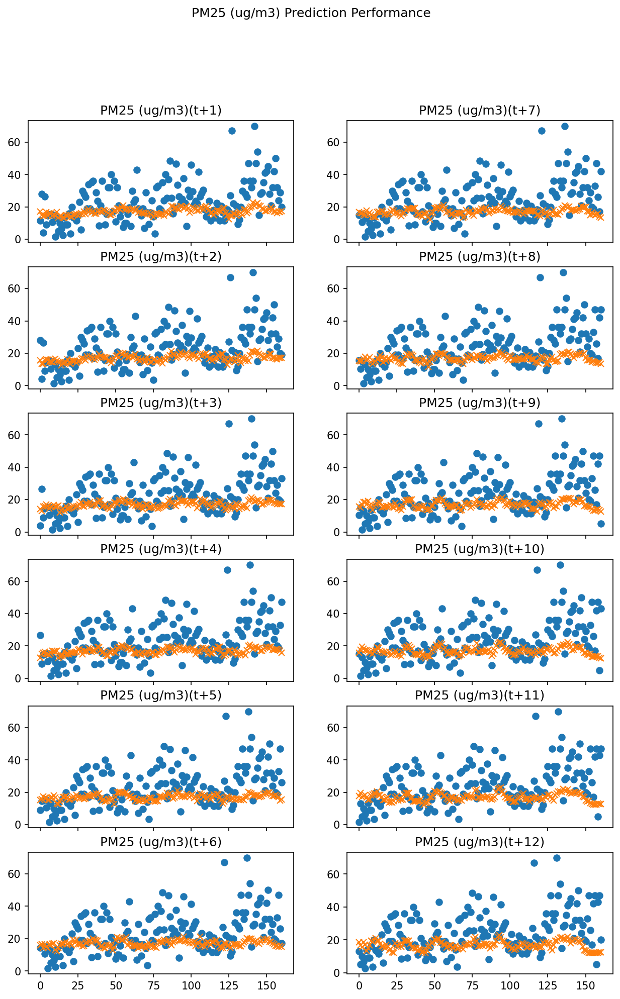

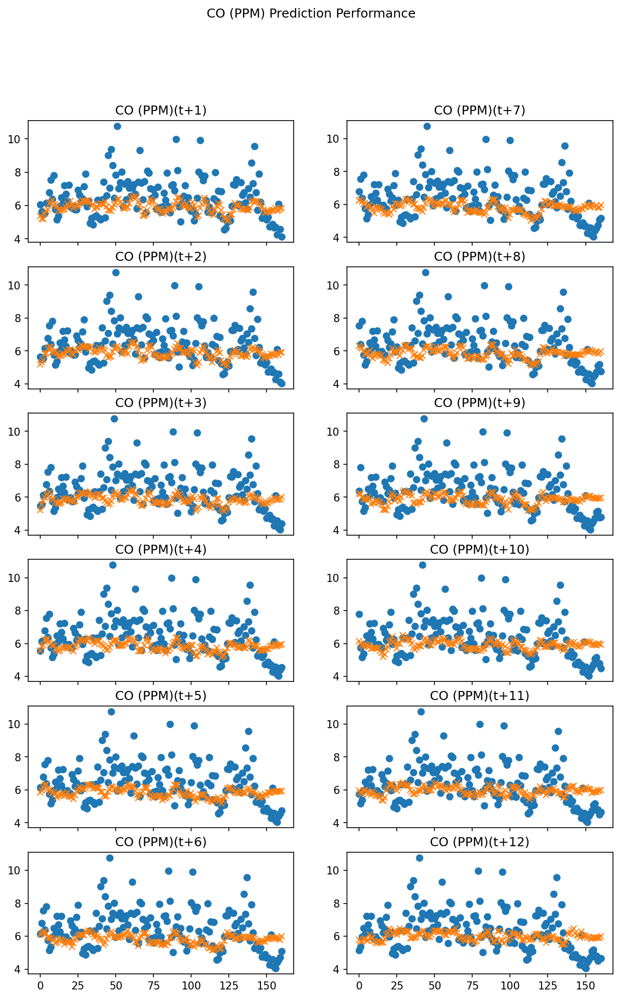

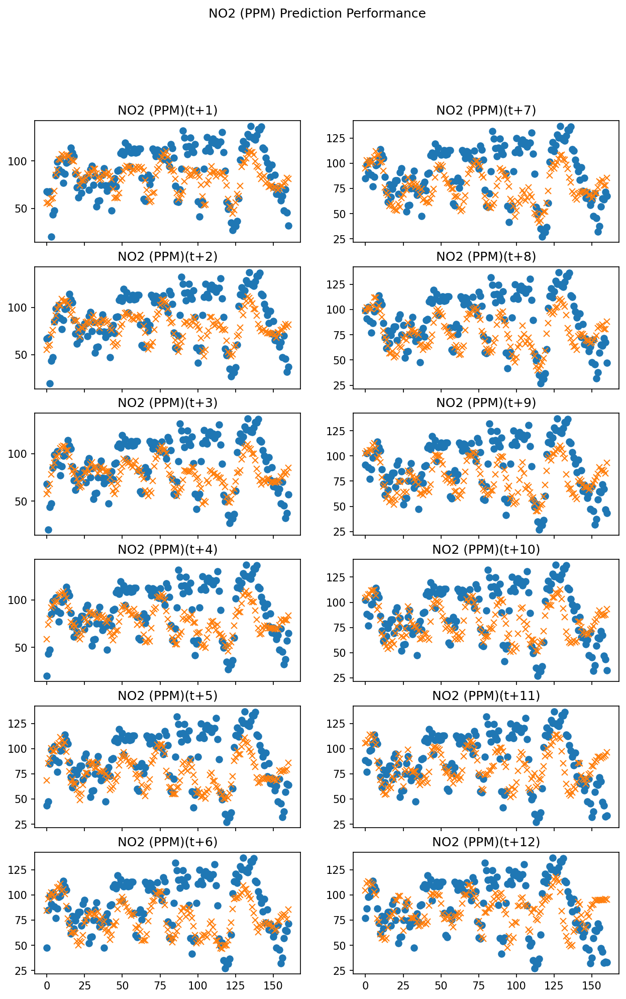

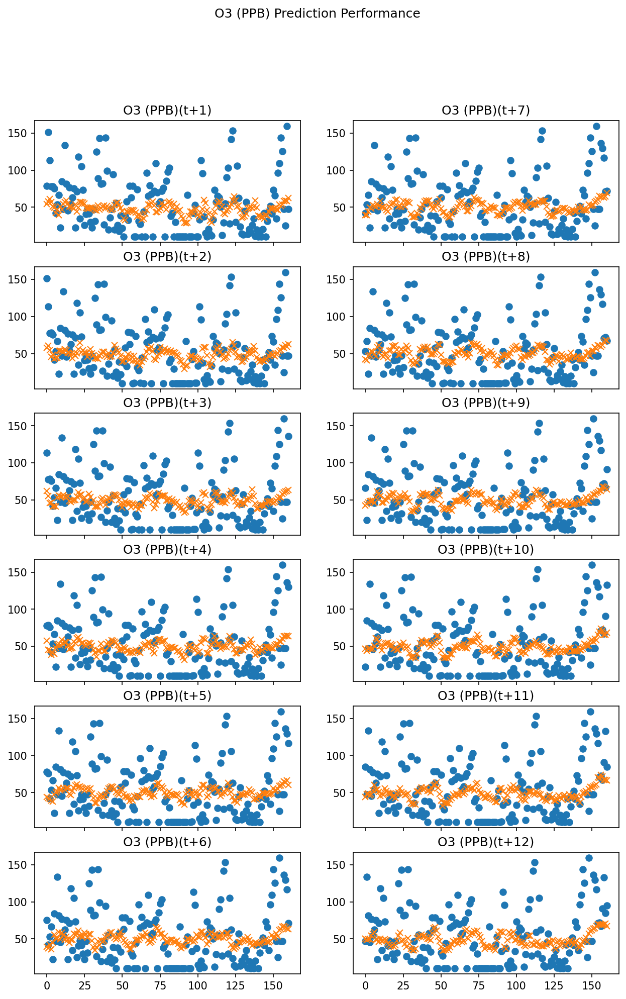

In [63]:
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]
t = np.arange(0, len(x_test_at_time['t+1']))

for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    for time_step, preds in y_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        ax[row][col].set_title('{}({})'.format(label_name, time_step))
        ax[row][col].plot(t, y_test_time, 'o')
        ax[row][col].plot(t, y_pred_time, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Save the model for later use

In [175]:
import os

In [176]:
root_folder = 'ml_models_ts_singleton'
model_name = 'ensemble_stacking'
dir_name = os.path.join(root_folder, model_name)
model_to_dump = ensemble_model

In [177]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(dir_name):
    try:
        os.makedirs(dir_name)
    except OSError:
        print ("Creation of the directory %s failed" % dir_name)
    else:
        print ("Successfully created the directory %s" % dir_name)
file_name = '{}_model.sav'.format(model_name)
file_path = os.path.join(dir_name, file_name)
joblib.dump(model_to_dump, file_path)
print('Dumped model into file ({})'.format(file_path))
print('done!')

Dumped model into file (ml_models_ts_singleton\ensemble_stacking\ensemble_stacking_model.sav)
done!


### try to load model

In [56]:
import os

In [57]:
loaded_model = {}
root_folder = 'ml_models_ts_singleton'
model_name = 'ensemble_stacking'
dir_name = os.path.join(root_folder, model_name)

In [58]:
file_name = '{}_model.sav'.format(model_name)
file_path = os.path.join(dir_name, file_name)
if os.path.exists(file_path):
    loaded_model = joblib.load(file_path)
    print('Loaded model from file {}'.format(file_name))
else:
    print('Model does not exist.')
if loaded_model:
    ensemble_model = loaded_model
else:
    print('warning! nothing loaded in model.')
print('done!')

Loaded model from file ensemble_stacking_model.sav
done!


# Do some statistical testing on the ensemble model vs the recurrent SVR

In [201]:
from scipy import stats

In [202]:
# build predictors
rsvr_predictor = RecurrentPredictor(rsvr_model)
ensemble_predictor = RecurrentPredictor(ensemble_model)

In [203]:
# get all predictions for the test set
x_test = x_test_at_time['t+1']
y_rsvr_predicted, y_ens_predicted = {}, {}
for time_step in x_test_at_time:
    time_step_num = int(time_step.split('+')[1])
    rsvr_preds = rsvr_predictor.predict(x_test, time_step_num)
    ens_preds = ensemble_predictor.predict(x_test, time_step_num)
    y_rsvr_predicted[time_step] = rsvr_preds
    y_ens_predicted[time_step] = ens_preds

In [204]:
# gather plcc for recurrent svr
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]
rsvr_plcc = {}
for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('PLCC for {}'.format(label_name))
    rsvr_plcc[label_name] = list()
    for time_step, preds in y_rsvr_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        rsvr_plcc[label_name].append(plcc[0])
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for PM25 (ug/m3)
Model(t+1): (0.3863152819156535, 4.159846177275509e-07)
Model(t+2): (0.35599677434976074, 3.5754627961266476e-06)
Model(t+3): (0.33289654278564657, 1.5975596714322755e-05)
Model(t+4): (0.2599898972901588, 0.0008663943753651022)
Model(t+5): (0.11804029553518568, 0.1358796367066028)
Model(t+6): (0.051639092344414717, 0.5153335052074499)
Model(t+7): (0.062198432434289415, 0.43314600667398834)
Model(t+8): (0.0360266995254586, 0.6500353798376313)
Model(t+9): (0.0844317280893227, 0.2869330894662853)
Model(t+10): (0.04846928532438745, 0.5414821273367527)
Model(t+11): (0.05440367942186757, 0.49306983491000245)
Model(t+12): (0.09866596900723852, 0.21305211092714044)
PLCC for CO (PPM)
Model(t+1): (0.4259885708778738, 1.762568737067741e-08)
Model(t+2): (0.18500223853560882, 0.018801549267274485)
Model(t+3): (0.07886683468073456, 0.3199986984367746)
Model(t+4): (0.03709252707956242, 0.6403961580629688)
Model(t+5): (0.0053618596945916325, 0.9461798870004098)
Model(t+6): (0.032

In [205]:
# gather plcc for ensemble
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]
ensemble_plcc = {}
for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('PLCC for {}'.format(label_name))
    ensemble_plcc[label_name] = list()
    for time_step, preds in y_ens_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        ensemble_plcc[label_name].append(plcc[0])
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for PM25 (ug/m3)
Model(t+1): (0.3230029283620087, 2.9267779478485497e-05)
Model(t+2): (0.30644102753315683, 7.700093267911931e-05)
Model(t+3): (0.2960766779033724, 0.00013707957364151685)
Model(t+4): (0.20502722557472436, 0.00908046031181773)
Model(t+5): (0.143283337760951, 0.06979118820344586)
Model(t+6): (0.14481003925236816, 0.0668339207744516)
Model(t+7): (0.24384013470103755, 0.0018266129495715531)
Model(t+8): (0.27024394404746455, 0.000526240485612525)
Model(t+9): (0.27714117476372196, 0.00037212485292773266)
Model(t+10): (0.282011909603049, 0.0002897517278702746)
Model(t+11): (0.22079795516108214, 0.00488371334949679)
Model(t+12): (0.19750093399435098, 0.012029901238009195)
PLCC for CO (PPM)
Model(t+1): (0.2565909098763047, 0.0010176878355240622)
Model(t+2): (0.19909179064236276, 0.011344401511521912)
Model(t+3): (0.14834863380581434, 0.060371366207077316)
Model(t+4): (0.08859582204308497, 0.26374003367988297)
Model(t+5): (0.08723031570262933, 0.2712000385305122)
Model(t+6)

In [212]:
print('-- PLCC two tailed t-test --')
for label_name in rsvr_plcc:
    print('-- two-tailed t-test for {} --'.format(label_name))
    ttest, pval = stats.ttest_ind(ensemble_plcc[label_name], rsvr_plcc[label_name])
    print('p-val = {}, stats = {}'.format(pval, ttest))
    if abs(pval) > 0.05:
        print("==both are statistically insignificant")
    elif ttest < 0.0:
        print("==rsvr_plcc is superior")
    else:
        print("==(!!!) ensemble is superior")

-- PLCC two tailed t-test --
-- two-tailed t-test for PM25 (ug/m3) --
p-val = 0.05909104608565069, stats = 1.9905970690600103
==both are statistically insignificant
-- two-tailed t-test for CO (PPM) --
p-val = 0.6061545327214575, stats = -0.5230696498579497
==both are statistically insignificant
-- two-tailed t-test for NO2 (PPM) --
p-val = 0.020747854785781804, stats = 2.4915143866615717
==(!!!) ensemble is superior
-- two-tailed t-test for O3 (PPB) --
p-val = 0.00019106947713136804, stats = 4.47069351196485
==(!!!) ensemble is superior


In [207]:
# gather rmse for recurrent svr
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]
rsvr_rmse = {}
for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('RMSE for {}'.format(label_name))
    rsvr_rmse[label_name] = list()
    for time_step, preds in y_rsvr_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        rsvr_rmse[label_name].append(rmse)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for PM25 (ug/m3)
Model(t+1): 8.940957672300172
Model(t+2): 9.144509462021187
Model(t+3): 9.27682933817814
Model(t+4): 9.482399026462225
Model(t+5): 9.642739982928846
Model(t+6): 9.705519022448705
Model(t+7): 9.655937570540816
Model(t+8): 9.648403394713407
Model(t+9): 9.512535498252822
Model(t+10): 9.516536978723806
Model(t+11): 9.450032816656538
Model(t+12): 9.297997083171655
RMSE for CO (PPM)
Model(t+1): 0.7485187858891074
Model(t+2): 0.8923768445611326
Model(t+3): 0.9822265482728503
Model(t+4): 1.0741576204076868
Model(t+5): 1.2243661241112758
Model(t+6): 1.469742532633162
Model(t+7): 1.81889405164427
Model(t+8): 2.0788245172730084
Model(t+9): 2.226436415284356
Model(t+10): 2.212751293046206
Model(t+11): 2.0946637334597464
Model(t+12): 1.9966329367453004
RMSE for NO2 (PPM)
Model(t+1): 21.046459197587534
Model(t+2): 26.419407873253608
Model(t+3): 31.184619769067762
Model(t+4): 35.03204610951718
Model(t+5): 39.094140427715786
Model(t+6): 43.77098553025195
Model(t+7): 48.4942401012

In [208]:
# gather rmse for ensemble
ignore_cols = ['Temperature (°C)', 'Humidity (%RH)', 'date', 'Wind Direction Code', 'api_weather Code', 
              'Wind Speed (m/s)']
cols = [val for val in dataset.columns.values if val not in ignore_cols]
ensemble_rmse = {}
for label_name in cols:
    target_idx = 0
    for col in dataset.columns:
        if col is label_name:
            break
        target_idx += 1
    print('RMSE for {}'.format(label_name))
    ensemble_rmse[label_name] = list()
    for time_step, preds in y_ens_predicted.items():
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        ensemble_rmse[label_name].append(rmse)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for PM25 (ug/m3)
Model(t+1): 8.93598954868466
Model(t+2): 9.047374670288622
Model(t+3): 9.122866975866788
Model(t+4): 9.26866564467554
Model(t+5): 9.375796240241604
Model(t+6): 9.340983119971183
Model(t+7): 9.23820316200062
Model(t+8): 9.30737770620525
Model(t+9): 9.393271006925996
Model(t+10): 9.358901046776094
Model(t+11): 9.399632821386566
Model(t+12): 9.41863277094173
RMSE for CO (PPM)
Model(t+1): 0.8271809246471916
Model(t+2): 0.867995117716665
Model(t+3): 0.8938335337314536
Model(t+4): 0.9222318073377
Model(t+5): 0.930085110702095
Model(t+6): 0.9342619293834488
Model(t+7): 0.9376381255369511
Model(t+8): 0.9272228292665556
Model(t+9): 0.9214219998525303
Model(t+10): 0.9239881161211525
Model(t+11): 0.9253721469186252
Model(t+12): 0.9268811627755188
RMSE for NO2 (PPM)
Model(t+1): 23.18264448453931
Model(t+2): 26.022699022393695
Model(t+3): 27.60636653367608
Model(t+4): 28.958677994297773
Model(t+5): 29.422650997717536
Model(t+6): 29.10329532540562
Model(t+7): 28.482985052302162

In [211]:
print('-- RMSE two tailed t-test --')
for label_name in rsvr_plcc:
    print('-- two-tailed t-test for {} --'.format(label_name))
    ttest, pval = stats.ttest_ind(ensemble_rmse[label_name], rsvr_rmse[label_name])
    print('p-val = {}, stats = {}'.format(pval, ttest))
    if abs(pval) > 0.05:
        print("==both are statistically insignificant")
    elif ttest < 0.0:
        print("==(!!!) ensemble is superior")
    else:
        print("==rsvr is superior")

-- RMSE two tailed t-test --
-- two-tailed t-test for PM25 (ug/m3) --
p-val = 0.04439307259329446, stats = -2.1322804828695383
==(!!!) ensemble is superior
-- two-tailed t-test for CO (PPM) --
p-val = 0.0005472529711903156, stats = -4.039883698018184
==(!!!) ensemble is superior
-- two-tailed t-test for NO2 (PPM) --
p-val = 0.0002830749300184615, stats = -4.309819049328355
==(!!!) ensemble is superior
-- two-tailed t-test for O3 (PPB) --
p-val = 1.0434266296184861e-05, stats = -5.6758823883133696
==(!!!) ensemble is superior
